# Latent space models on networks

In [1]:
import sys
import os
sys.path.append(os.path.abspath(".."))


from LSMN_P import *

## Network

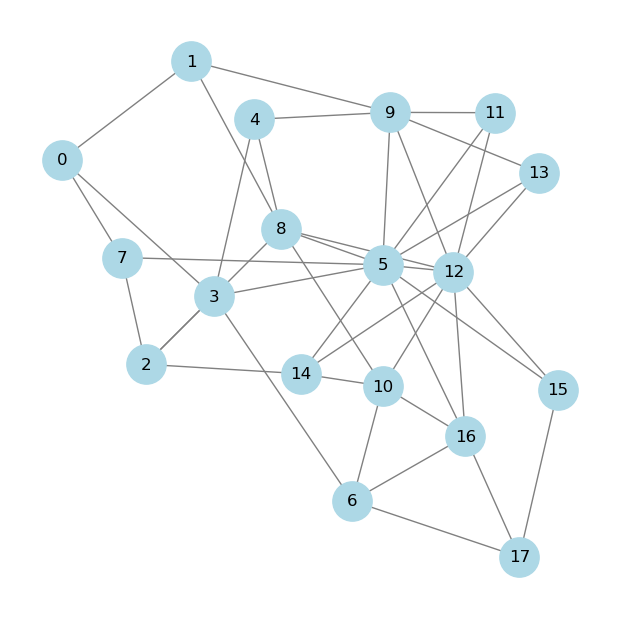

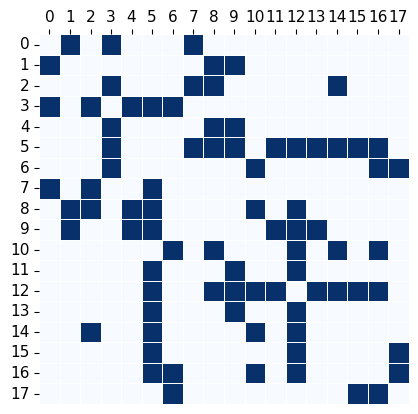

In [2]:
import zipfile
from io import BytesIO as StringIO

with zipfile.ZipFile("sampson_data.zip") as zf:
    g = StringIO(zf.read("samplike1.txt"))

G = nx.read_edgelist(g, delimiter="\t")
node_mapping = {node: i for i, node in enumerate(G.nodes())}
G = nx.relabel_nodes(G, node_mapping)
n = len(G.nodes)
plt.figure(figsize=(6,6))
nx.draw(G, pos=nx.spring_layout(G, k=0.1, iterations=50, seed=90),with_labels=True, node_color='lightblue', edge_color='gray', node_size=800)
#plt.title("Monks Network")
plt.show()

Y = nx.to_numpy_array(G, dtype=float)

sns.heatmap(Y, annot=False, cmap="Blues", cbar=False, square=True, linewidths=0.5, linecolor='white')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.gca().xaxis.tick_top() 
plt.gca().tick_params(top=True, bottom=False, labeltop=True, labelbottom=False, labelsize=11)
#plt.title("Sociomatrix")
plt.show()

# Model $\mathbb{R}^1$

Metropolis-Hastings for Euclidean latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 50000 and thinning 50
Number of draws per chain: 300000
Initial sigma_q_Z: 1.0000
Initial sigma_q_alpha: 1.0000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 20 starts: -89.4220
------------------------------------------------------------
Log-prior:
sigma_prior_Z:  5.0
sigma_prior_alpha:  5.0
********************************
Chain 0
********************************


Sampling progress:  17%|█▋        | 50006/300000 [17:55<1:27:53, 47.40 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 2.3817
Final sigma_q_alpha: 0.6146


Sampling progress: 100%|██████████| 300000/300000 [2:01:50<00:00, 41.04 draws/s]  


********************************
Chain 1
********************************


Sampling progress:  17%|█▋        | 50008/300000 [26:05<1:35:50, 43.47 draws/s] 

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 2.0405
Final sigma_q_alpha: 0.6305


Sampling progress: 100%|██████████| 300000/300000 [1:58:26<00:00, 42.21 draws/s]  


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0000
Minimum ESS/n: 0.7036
Maximum ESS/n: 0.9032
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial            -93.5464         -48.3447        -141.8911
ML                 -89.4220         -58.0833        -147.5052
CM                 -84.1225         -49.0459        -133.1685
MAP                -67.6815         -50.0265        -117.7080
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 350.1598
DIC: 349.2911
BIC: 423.9884

Final acceptance rate Z: 0.4102
Final acceptance rate alpha: 0.3877
********************************
E

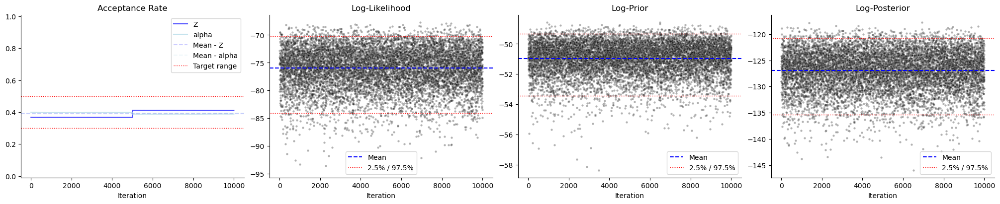

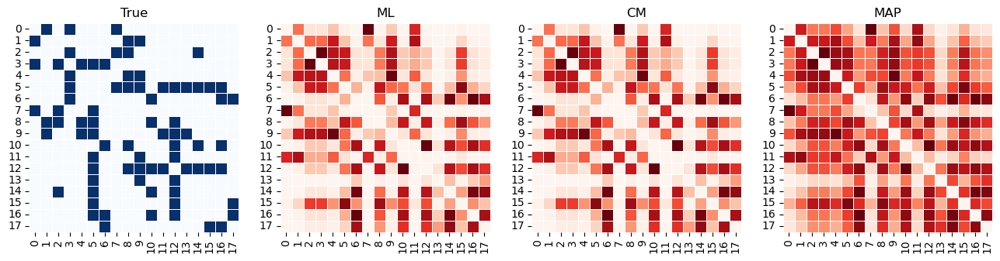

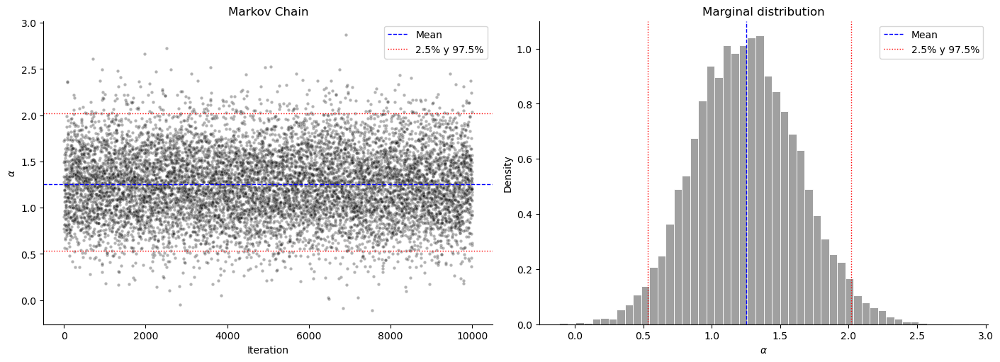

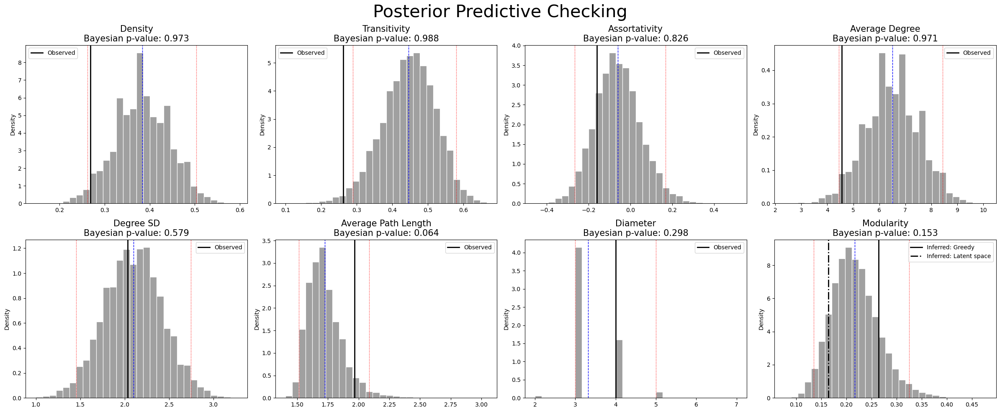

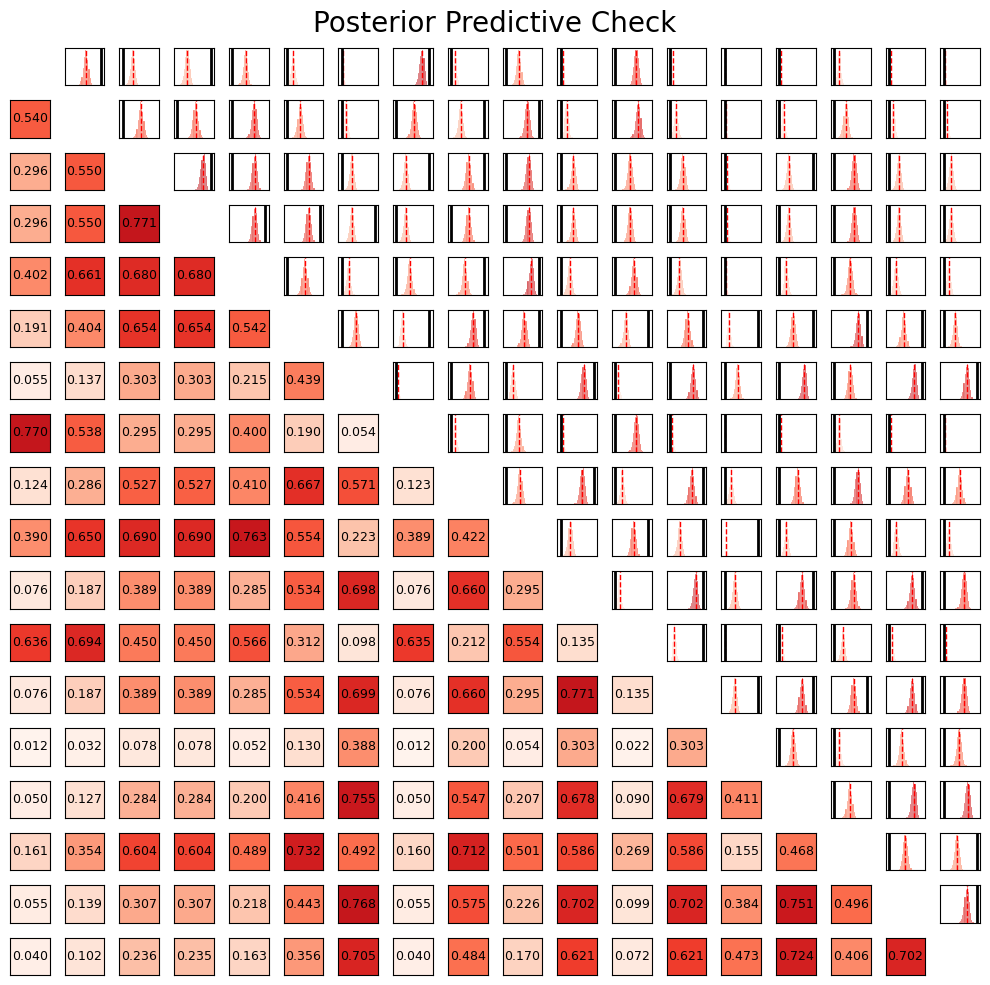

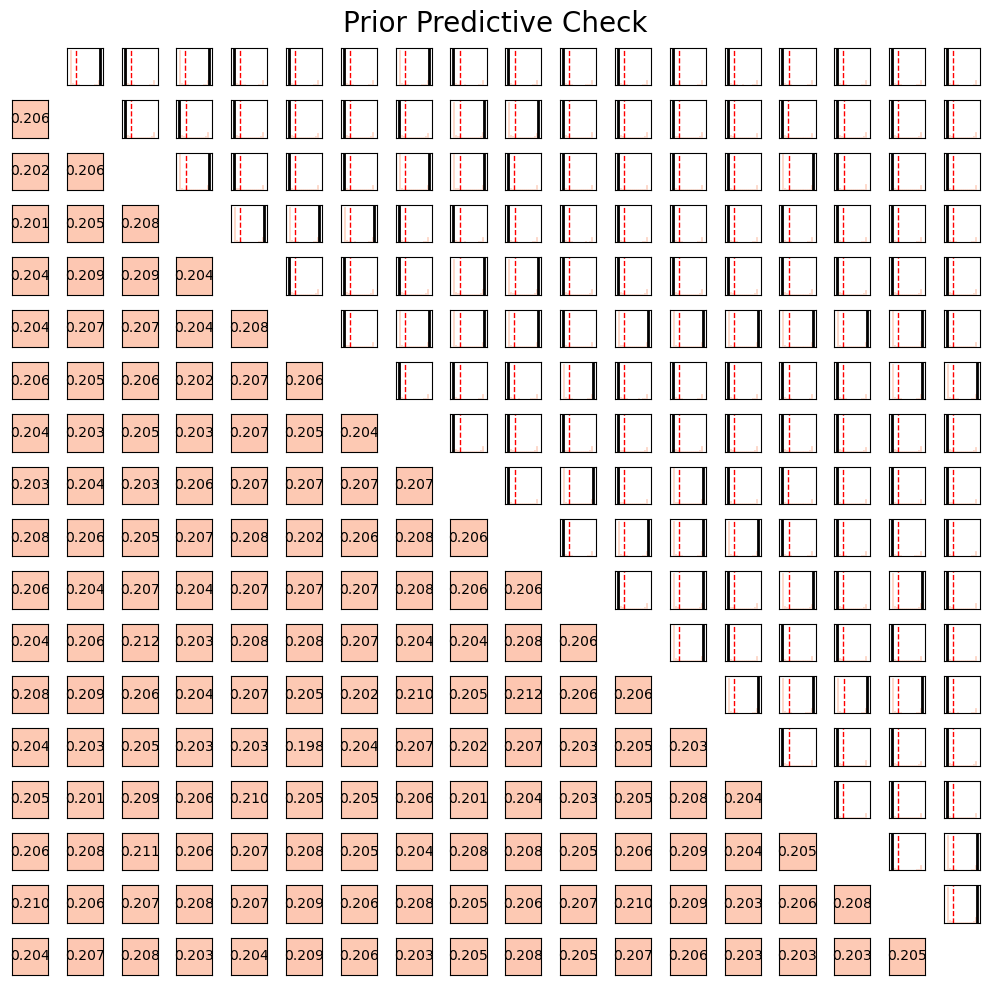

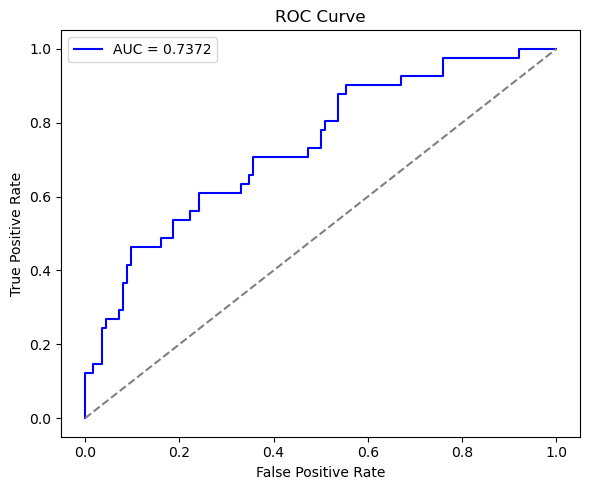

Model: Euclidean
Confussion matrix:  {'tp': 25, 'tn': 83, 'fp': 29, 'fn': 16}
AUC: 0.7372
Accuracy: 0.7059
Precision: 0.4630
Recall: 0.6098
F1-score: 0.5263
Specificity: 0.7411
Results successfully saved to: resultsR1.pkl


In [3]:
# Configuration
Theta_R1 = {
    'Z0': np.random.normal(0, 1, size=(n, 1)),
    'alpha0': np.float64(0.0),
    'sigma_prior_Z': 5.0,
    'sigma_prior_alpha': 5.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 50000,       
    'thin': 50,              
    'sigma_q_Z': 1.0,       
    'sigma_q_alpha': 1.0    
}

# Estimation
resultsR1 = Estimation_LSMN(Y, Theta_R1, Model="Euclidean")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsR1)

#Visualizing latent space
plot_latent_space(resultsR1)

# Posterior predictive checking
posterior_predictive_check(resultsR1)

# Prior predictive checking
prior_predictive_check(resultsR1)

# Prediction evaluation
metricsR1 = prediction_evaluation(resultsR1)

# Save results
handle_results(resultsR1, filepath='resultsR1.pkl', mode='save')

# Model $\mathbb{R}^2$

Metropolis-Hastings for Euclidean latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 50000 and thinning 75
Number of draws per chain: 425000
Initial sigma_q_Z: 1.0000
Initial sigma_q_alpha: 1.0000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 20 starts: -88.2270
------------------------------------------------------------
Log-prior:
sigma_prior_Z:  5.0
sigma_prior_alpha:  5.0
********************************
Chain 0
********************************


Sampling progress:  12%|█▏        | 50008/425000 [19:10<2:14:52, 46.34 draws/s] 

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 1.7223
Final sigma_q_alpha: 0.9704


Sampling progress: 100%|██████████| 425000/425000 [2:45:01<00:00, 42.92 draws/s]  


********************************
Chain 1
********************************


Sampling progress:  12%|█▏        | 50005/425000 [19:05<2:19:17, 44.87 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 1.7924
Final sigma_q_alpha: 0.8778


Sampling progress: 100%|██████████| 425000/425000 [2:43:41<00:00, 43.27 draws/s]  


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0006
Minimum ESS/n: 0.2987
Maximum ESS/n: 0.7190
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial            -93.3911         -65.2127        -158.6037
ML                 -88.2270         -82.4196        -170.6466
CM                 -83.5857         -73.2762        -156.8619
MAP                -53.4535         -72.8248        -126.2783
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 388.4213
DIC: 363.7493
BIC: 504.7341

Final acceptance rate Z: 0.3821
Final acceptance rate alpha: 0.3317
********************************
E

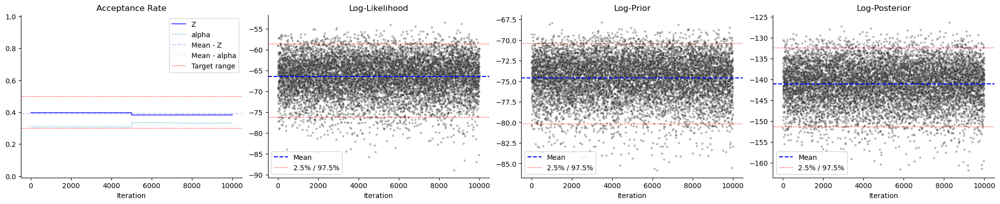

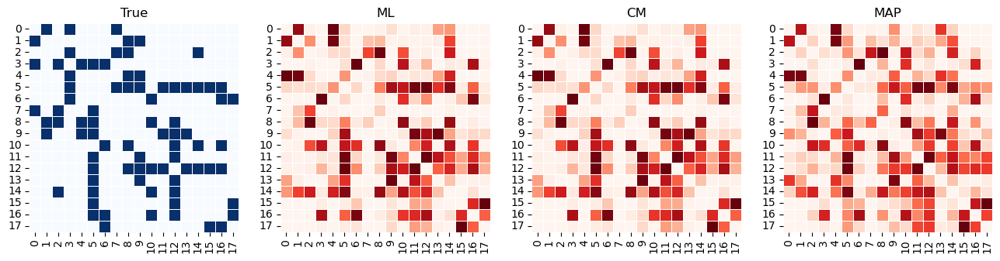

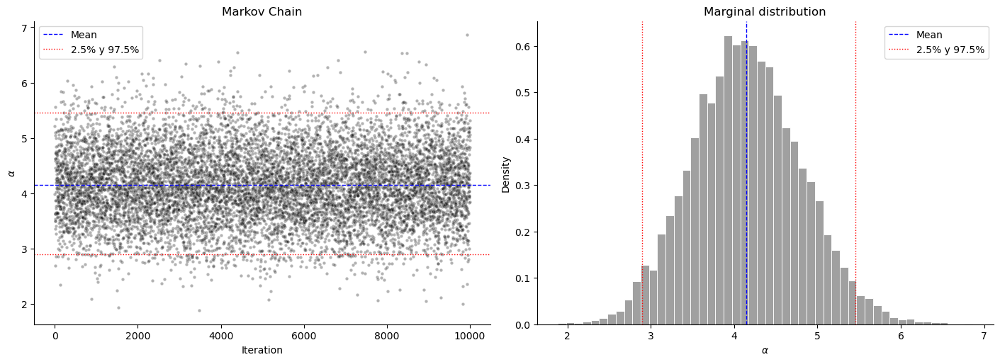

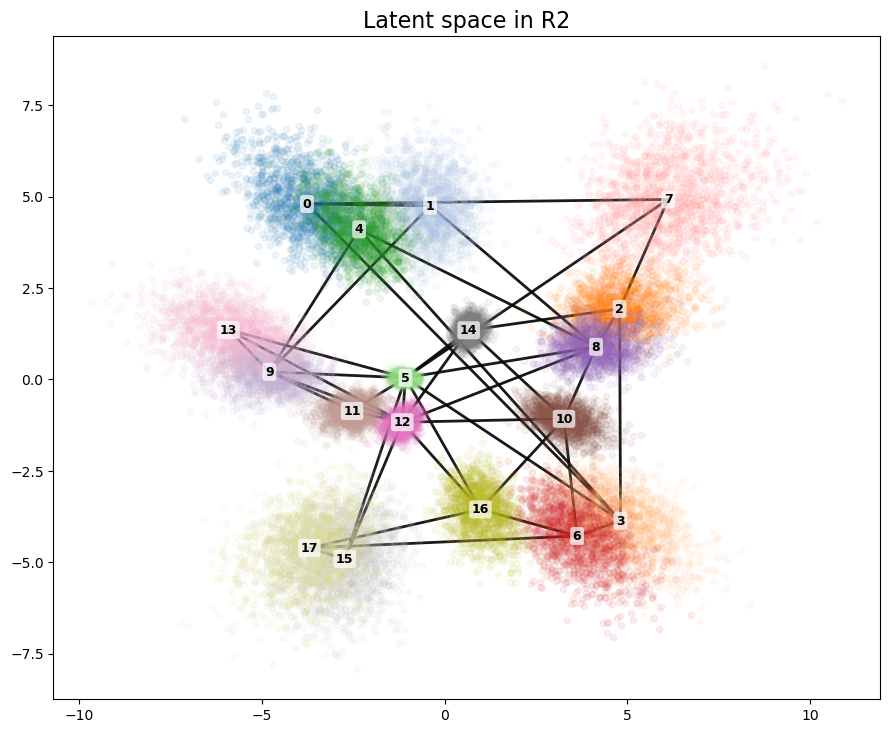

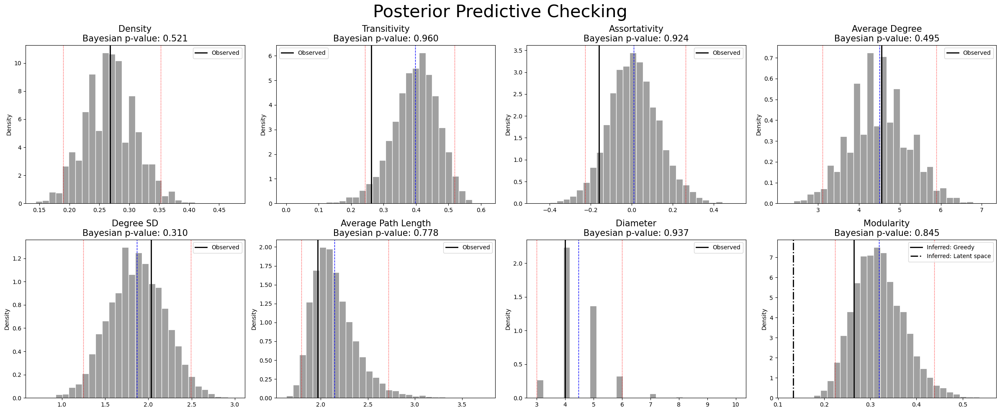

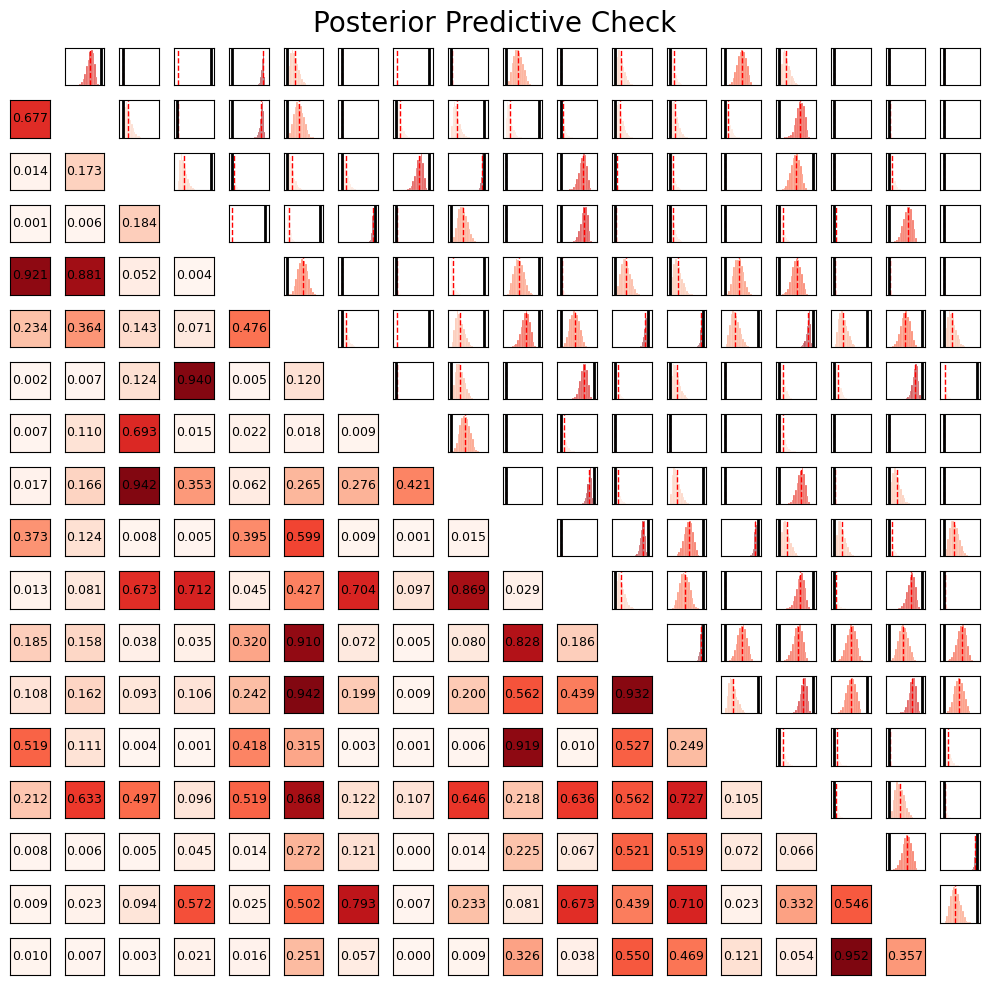

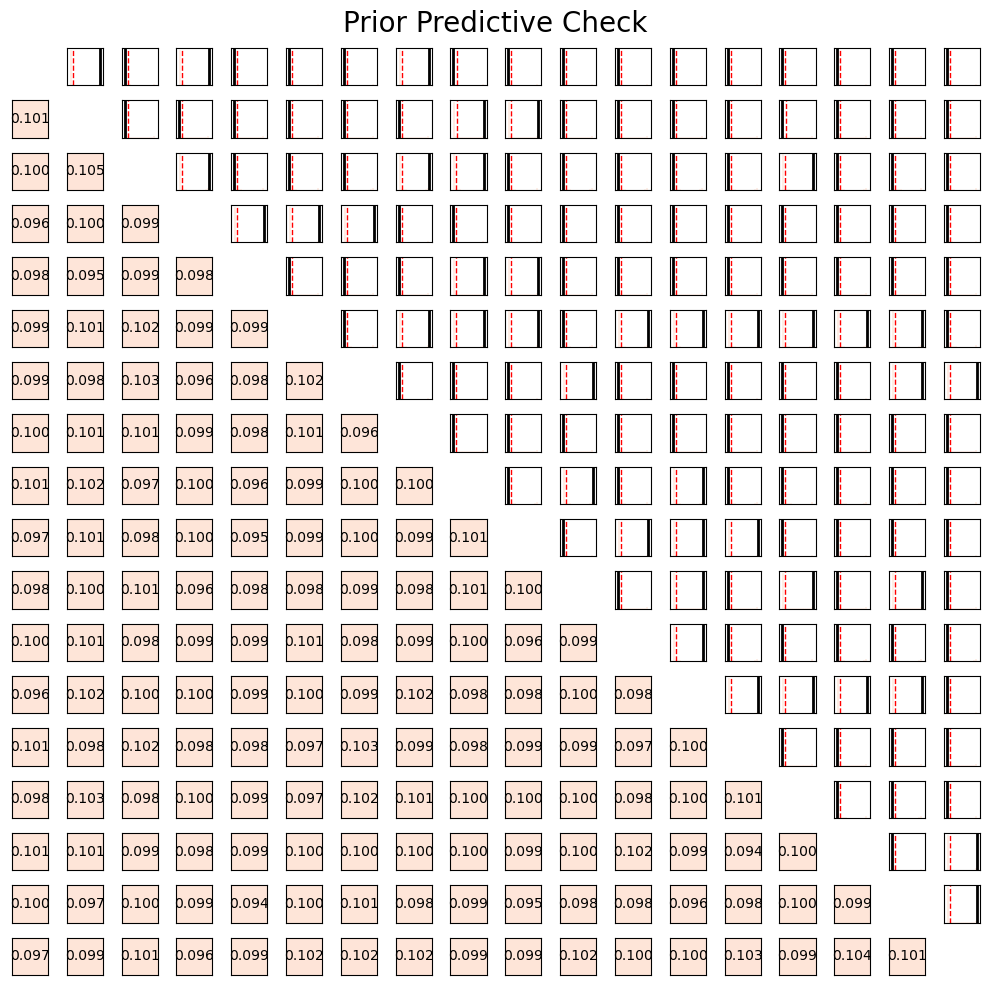

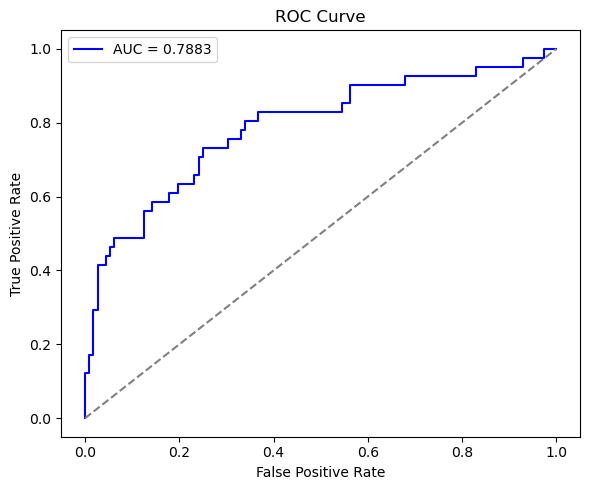

Model: Euclidean
Confussion matrix:  {'tp': 22, 'tn': 98, 'fp': 14, 'fn': 19}
AUC: 0.7883
Accuracy: 0.7843
Precision: 0.6111
Recall: 0.5366
F1-score: 0.5714
Specificity: 0.8750
Results successfully saved to: resultsR2.pkl


In [3]:
# Configuration
Theta_R2 = {
    'Z0': np.random.normal(0, 1, size=(n, 2)),
    'alpha0': np.float64(0.0),
    'sigma_prior_Z': 5.0,
    'sigma_prior_alpha': 5.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 50000,       
    'thin': 75,              
    'sigma_q_Z': 1.0,       
    'sigma_q_alpha': 1.0    
}

# Estimation
resultsR2 = Estimation_LSMN(Y, Theta_R2, Model="Euclidean")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsR2)

#Visualizing latent space
plot_latent_space(resultsR2)

# Posterior predictive checking
posterior_predictive_check(resultsR2)

# Prior predictive checking
prior_predictive_check(resultsR2)

# Prediction evaluation
metricsR2 = prediction_evaluation(resultsR2)

# Save results
handle_results(resultsR2, filepath='resultsR2.pkl', mode='save')

# Model $\mathbb{R}^3$

Metropolis-Hastings for Euclidean latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 50000 and thinning 75
Number of draws per chain: 425000
Initial sigma_q_Z: 1.0000
Initial sigma_q_alpha: 1.0000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 20 starts: -76.3370
------------------------------------------------------------
Log-prior:
sigma_prior_Z:  5.0
sigma_prior_alpha:  5.0
********************************
Chain 0
********************************


Sampling progress:  12%|█▏        | 50010/425000 [19:46<2:21:20, 44.22 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 1.5981
Final sigma_q_alpha: 0.9900


Sampling progress: 100%|██████████| 425000/425000 [2:43:05<00:00, 43.43 draws/s]  


********************************
Chain 1
********************************


Sampling progress:  12%|█▏        | 50009/425000 [18:28<2:14:50, 46.35 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 1.7395
Final sigma_q_alpha: 0.9801


Sampling progress: 100%|██████████| 425000/425000 [2:40:15<00:00, 44.20 draws/s]  


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0005
Minimum ESS/n: 0.2940
Maximum ESS/n: 0.5354
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial           -116.5736         -82.0964        -198.6700
ML                 -76.3370        -121.5577        -197.8947
CM                 -68.7261         -98.3081        -167.0342
MAP                -44.4137         -97.0614        -141.4751
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 372.5692
DIC: 340.3118
BIC: 528.1889

Final acceptance rate Z: 0.3731
Final acceptance rate alpha: 0.3201
********************************
E

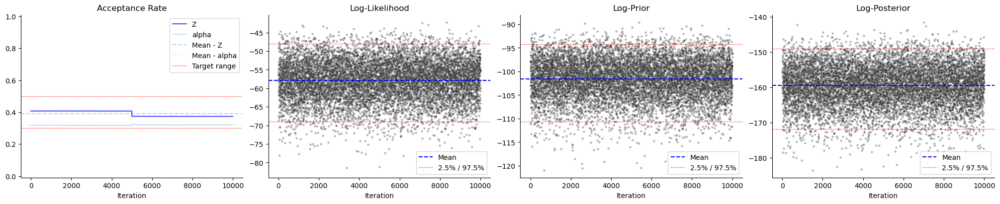

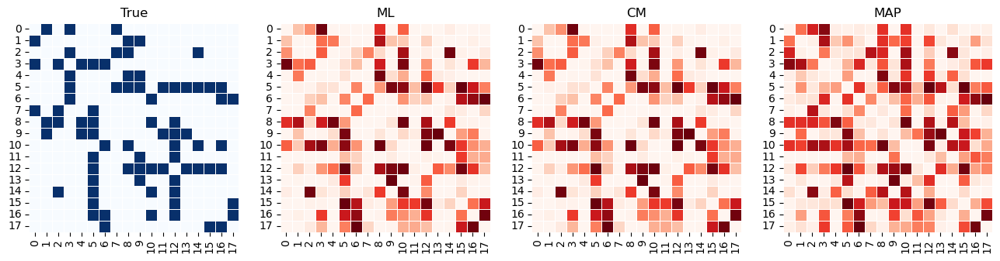

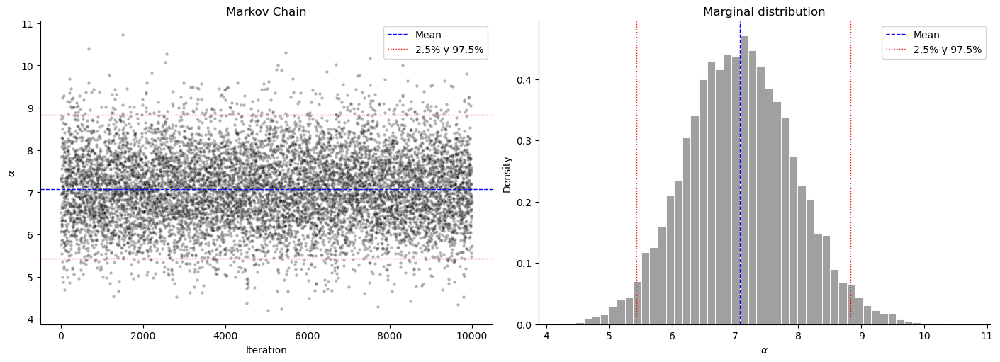

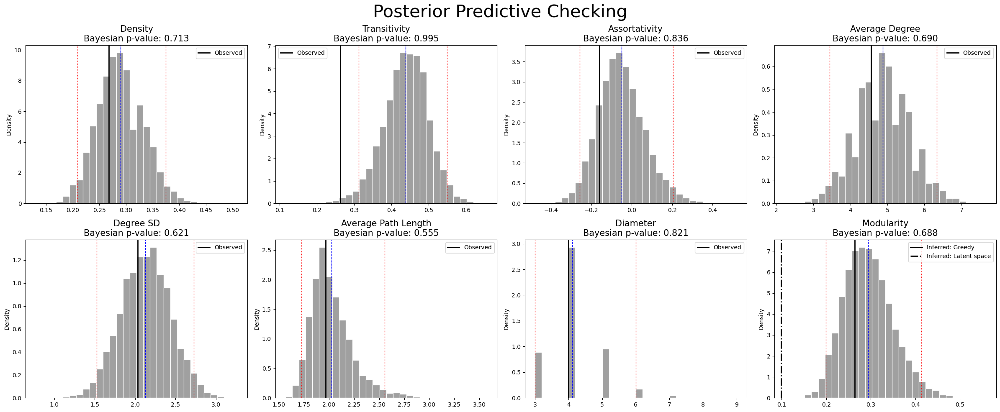

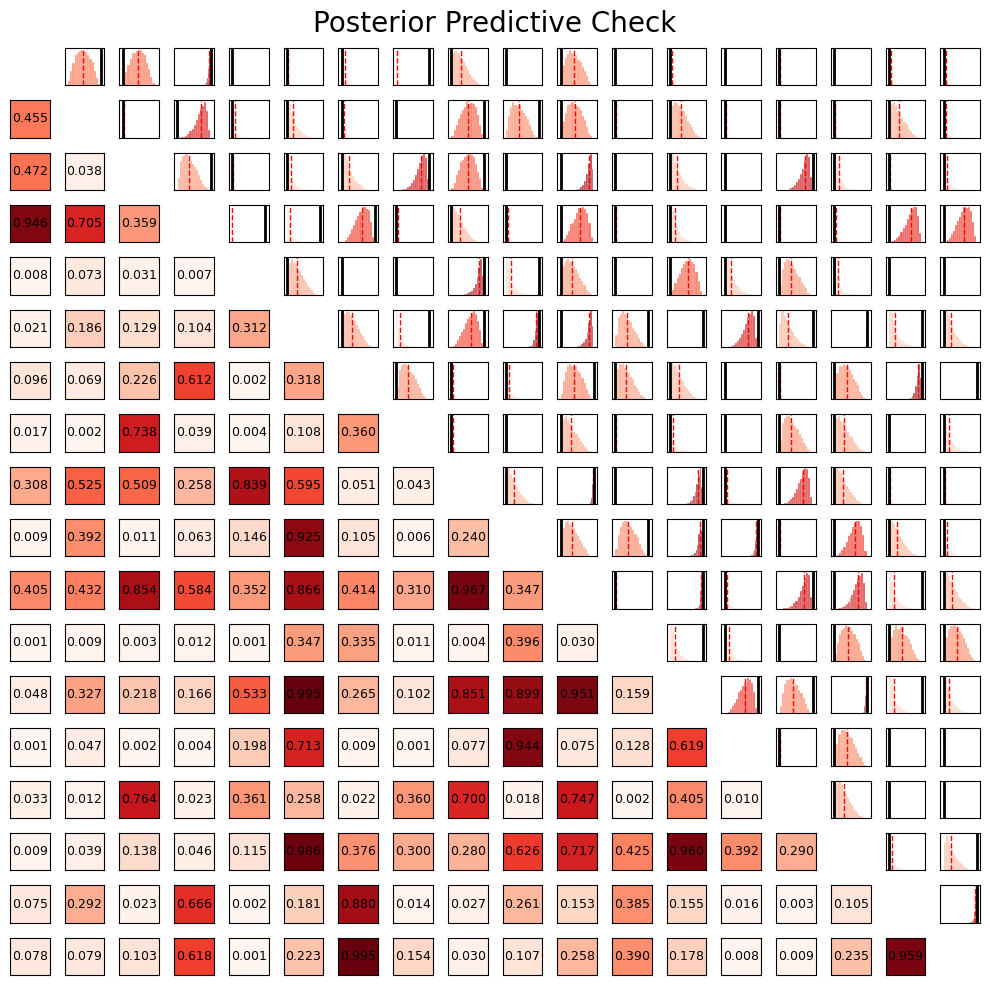

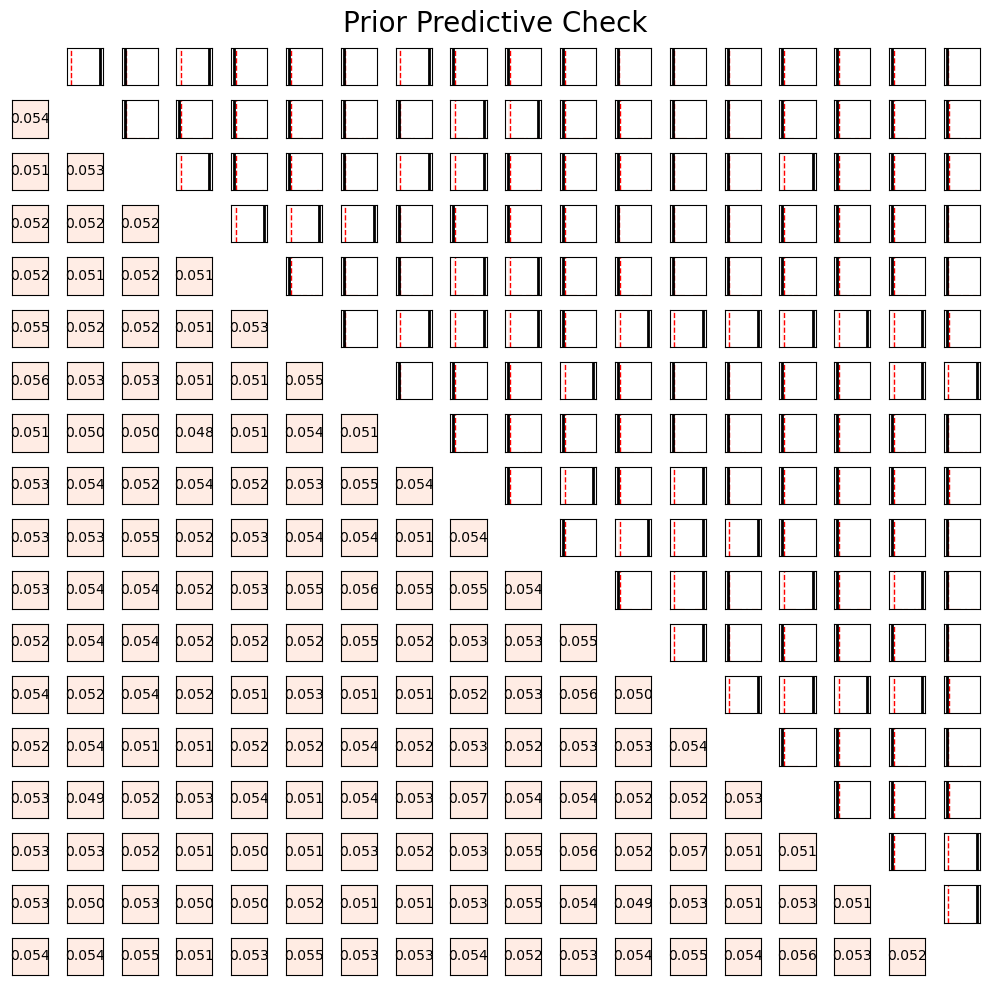

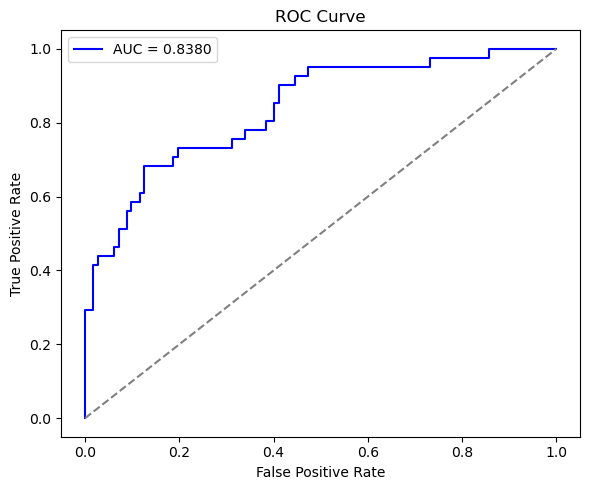

Model: Euclidean
Confussion matrix:  {'tp': 23, 'tn': 102, 'fp': 10, 'fn': 18}
AUC: 0.8380
Accuracy: 0.8170
Precision: 0.6970
Recall: 0.5610
F1-score: 0.6216
Specificity: 0.9107
Results successfully saved to: resultsR3.pkl


In [4]:
# Configuration
Theta_R3 = {
    'Z0': np.random.normal(0, 1, size=(n, 3)),
    'alpha0': np.float64(0.0),
    'sigma_prior_Z': 5.0,
    'sigma_prior_alpha': 5.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 50000,       
    'thin': 75,              
    'sigma_q_Z': 1.0,       
    'sigma_q_alpha': 1.0    
}

# Estimation
resultsR3 = Estimation_LSMN(Y, Theta_R3, Model="Euclidean")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsR3)

#Visualizing latent space
plot_latent_space(resultsR3)

# Posterior predictive checking
posterior_predictive_check(resultsR3)

# Prior predictive checking
prior_predictive_check(resultsR3)

# Prediction evaluation
metricsR3 = prediction_evaluation(resultsR3)

# Save results
handle_results(resultsR3, filepath='resultsR3.pkl', mode='save')

# Model $\mathbb{S}^1$

Metropolis-Hastings for Spherical latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 50000 and thinning 75
Number of draws per chain: 425000
Initial sigma_q_Z: 50.0000
Initial sigma_q_alpha: 0.5000
Initial sigma_q_beta: 0.5000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 20 starts: -73.3341
------------------------------------------------------------
Log-prior:
sigma_prior_alpha:  1.0
sigma_prior_beta:  1.0
********************************
Chain 0
********************************


Sampling progress:  12%|█▏        | 50009/425000 [13:58<1:54:16, 54.69 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 0.1000
Final sigma_q_alpha: 0.5692
Final sigma_q_beta: 0.6131


Sampling progress: 100%|██████████| 425000/425000 [1:58:17<00:00, 59.88 draws/s]  


********************************
Chain 1
********************************


Sampling progress:  12%|█▏        | 50013/425000 [13:59<1:42:43, 60.84 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 0.1000
Final sigma_q_alpha: 0.4500
Final sigma_q_beta: 0.6134


Sampling progress: 100%|██████████| 425000/425000 [2:05:59<00:00, 56.22 draws/s]  


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0003
Minimum ESS/n: 0.8863
Maximum ESS/n: 1.0000
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial           -285.2254         -34.7758        -320.0012
ML                 -73.3341         -72.6381        -145.9722
CM                 -68.5230         -44.3087        -112.8317
MAP                -68.4571         -41.8143        -110.2714
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 376.7440
DIC: 311.6855
BIC: 481.9903

Final acceptance rate Z: 0.3007
Final acceptance rate alpha: 0.4654
Final acceptance rate beta: 0.4856

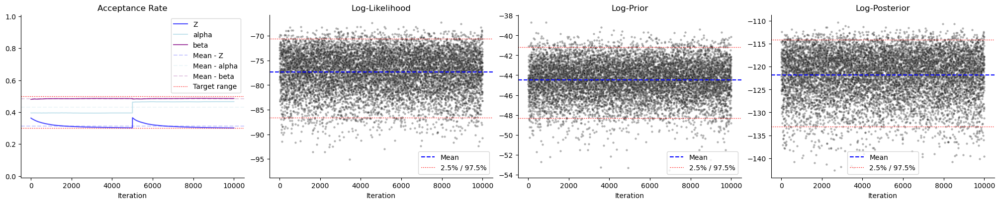

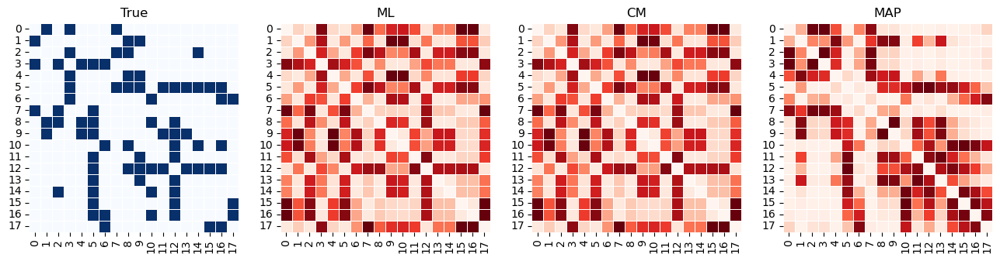

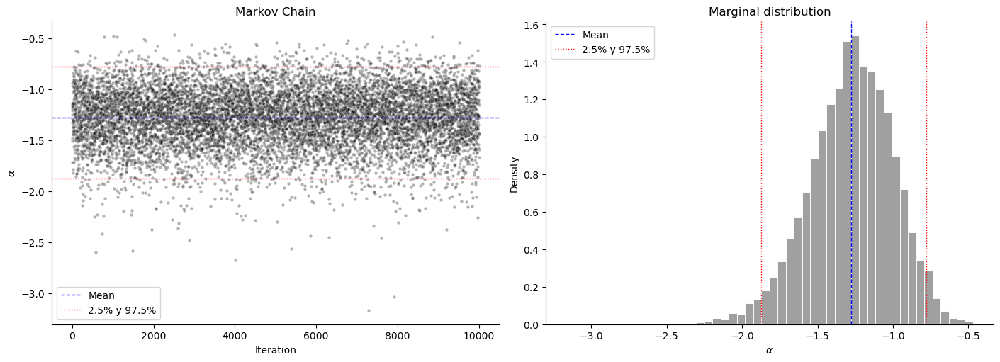

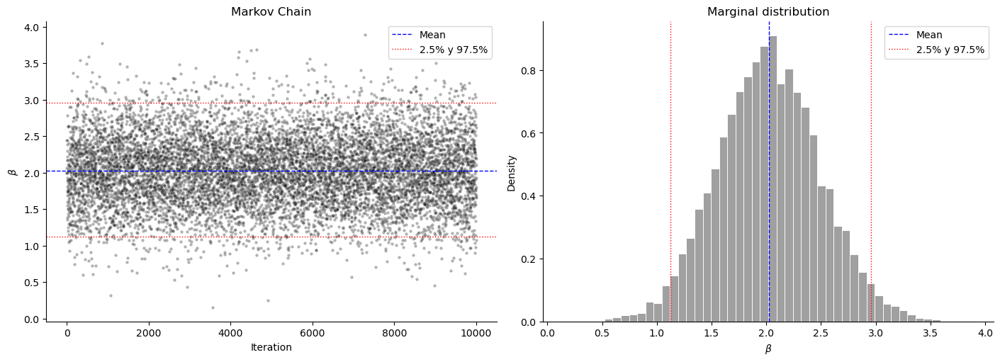

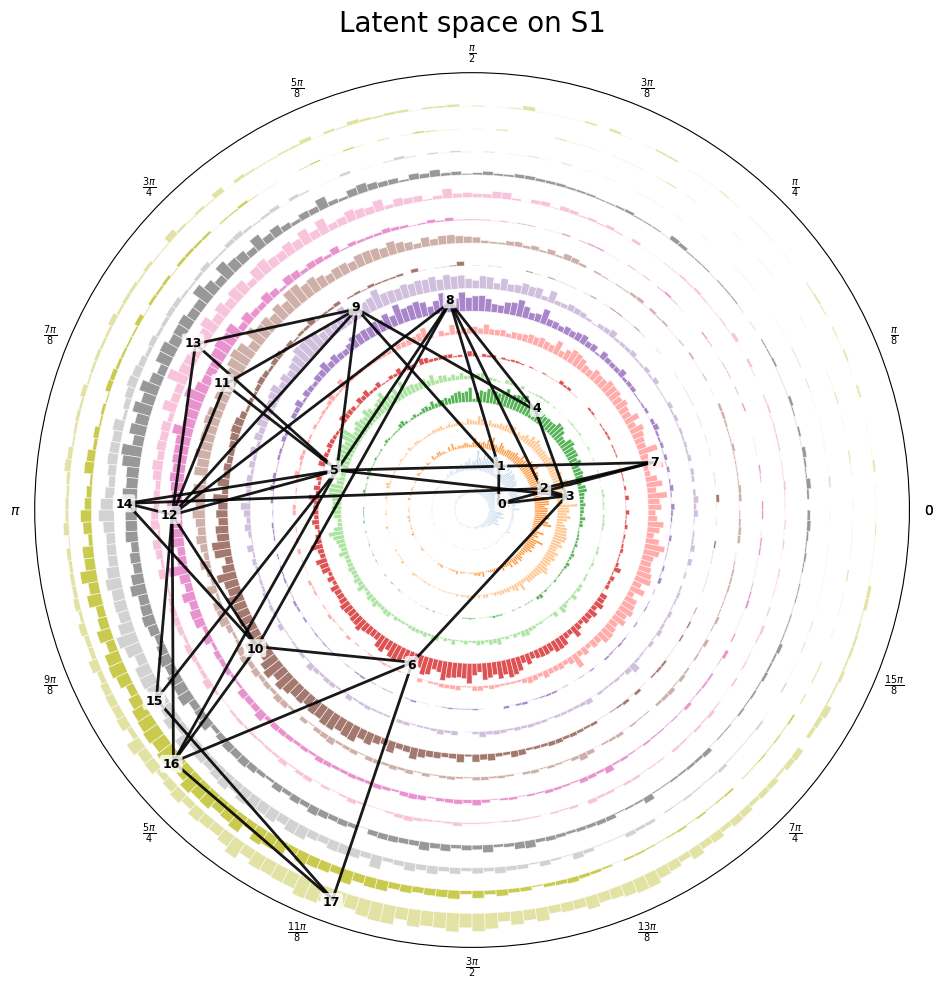

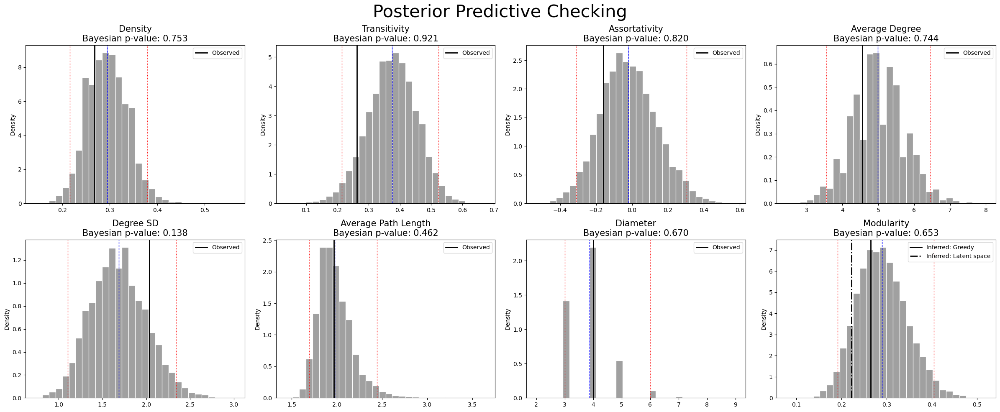

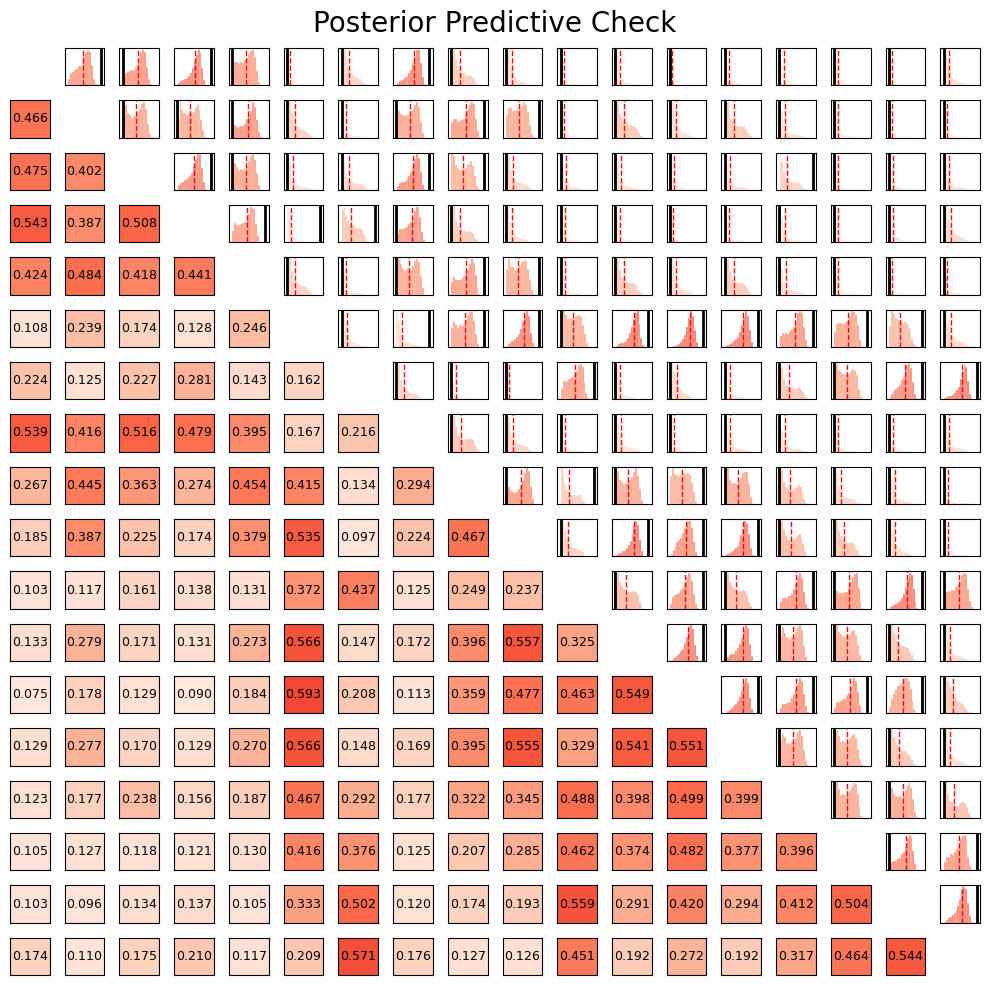

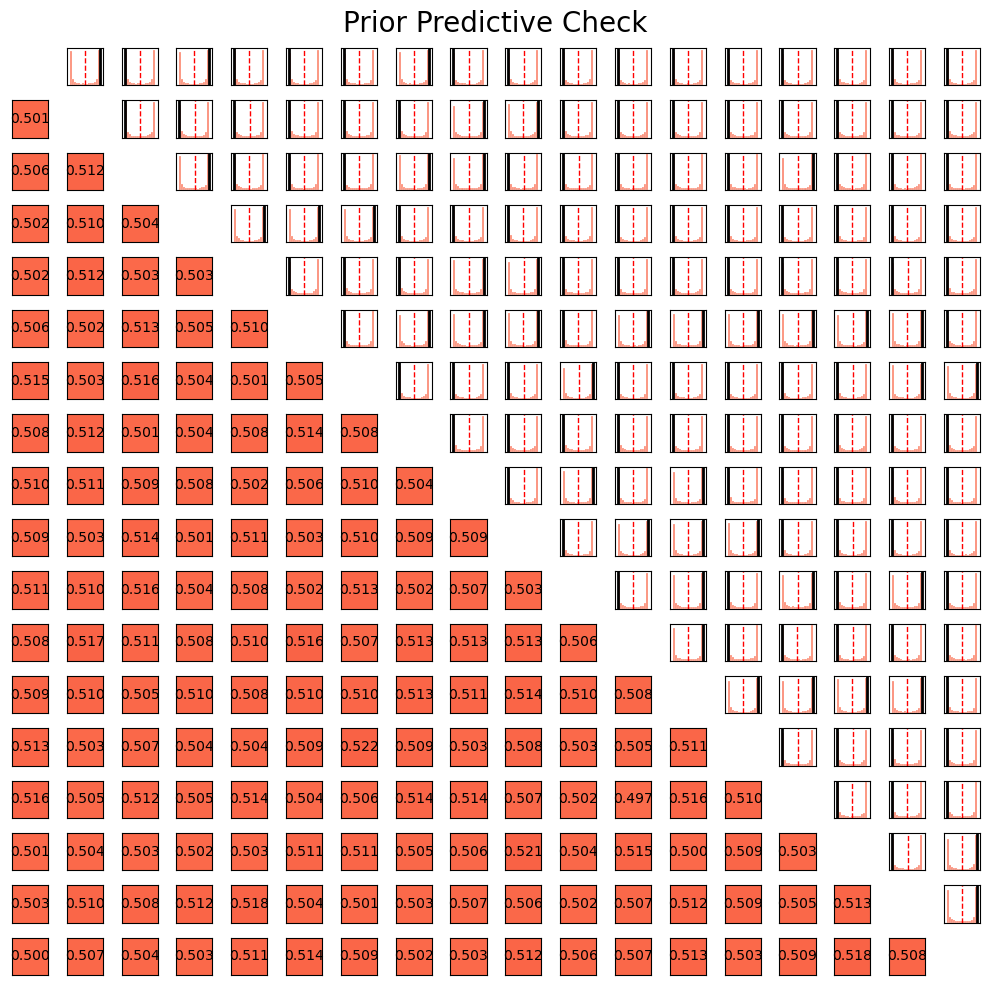

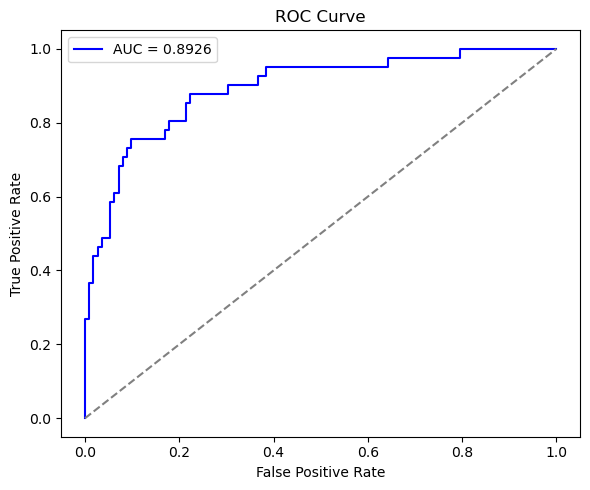

Model: Spherical
Confussion matrix:  {'tp': 16, 'tn': 110, 'fp': 2, 'fn': 25}
AUC: 0.8926
Accuracy: 0.8235
Precision: 0.8889
Recall: 0.3902
F1-score: 0.5424
Specificity: 0.9821
Results successfully saved to: resultsS1.pkl


In [5]:
# Configuration
Theta_S1 = {
    'Z0': random_VMF(np.array([0,1]), 0, n),
    'alpha0': np.float64(0.0),
    'beta0': np.float64(5.0),
    'rho': -0.5,
    'mu_alpha_beta': np.array([0.0, 5.0]),
    'sigma_prior_alpha': 1.0,
    'sigma_prior_beta': 1.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 50000,       
    'thin': 75,                
    'sigma_q_Z': 50.0,       
    'sigma_q_alpha': 0.5,    
    'sigma_q_beta': 0.5      
}

# Estimation
resultsS1 = Estimation_LSMN(Y, Theta_S1, Model="Spherical")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsS1)

#Visualizing latent space
plot_latent_space(resultsS1)

# Posterior predictive checking
posterior_predictive_check(resultsS1)

# Prior predictive checking
prior_predictive_check(resultsS1)

# Prediction evaluation
metricsS1 = prediction_evaluation(resultsS1)

# Save results
handle_results(resultsS1, filepath='resultsS1.pkl', mode='save')

# Model $\mathbb{S}^2$

Metropolis-Hastings for Spherical latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 50000 and thinning 75
Number of draws per chain: 425000
Initial sigma_q_Z: 50.0000
Initial sigma_q_alpha: 0.2000
Initial sigma_q_beta: 0.2000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 20 starts: -67.0348
------------------------------------------------------------
Log-prior:
sigma_prior_alpha:  1.0
sigma_prior_beta:  1.0
********************************
Chain 0
********************************


Sampling progress:  12%|█▏        | 50013/425000 [13:41<1:44:48, 59.63 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 3.8528
Final sigma_q_alpha: 0.4890
Final sigma_q_beta: 1.0741


Sampling progress: 100%|██████████| 425000/425000 [2:04:28<00:00, 56.91 draws/s]  


********************************
Chain 1
********************************


Sampling progress:  12%|█▏        | 50012/425000 [16:26<1:57:16, 53.29 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 4.1217
Final sigma_q_alpha: 0.4247
Final sigma_q_beta: 1.1452


Sampling progress: 100%|██████████| 425000/425000 [2:24:08<00:00, 49.14 draws/s]  


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0006
Minimum ESS/n: 0.9376
Maximum ESS/n: 1.0000
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial           -237.3788         -47.2525        -284.6313
ML                 -67.0348         -54.2204        -121.2552
CM                 -56.6788         -52.9355        -109.6142
MAP                -57.0177         -51.6965        -108.7142
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 379.4457
DIC: 338.0980
BIC: 496.1195

Final acceptance rate Z: 0.4572
Final acceptance rate alpha: 0.4986
Final acceptance rate beta: 0.3899

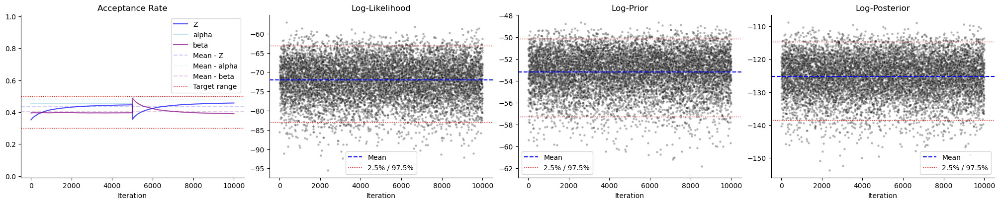

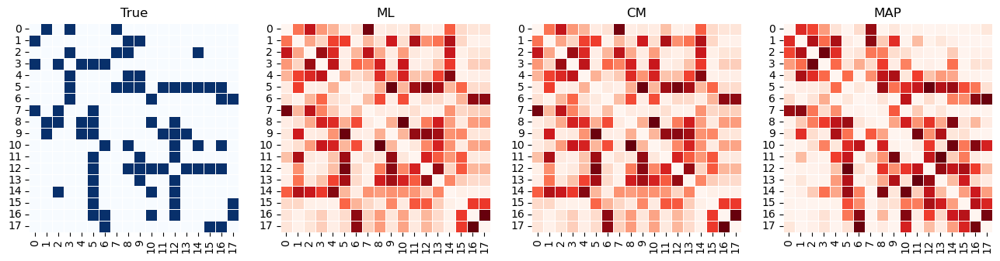

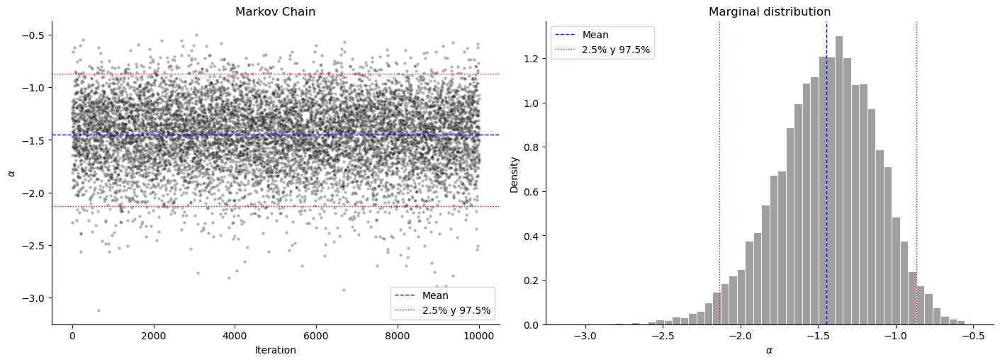

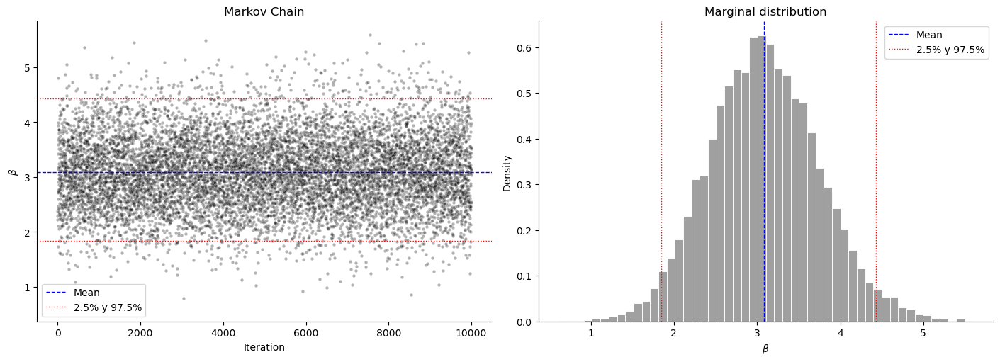

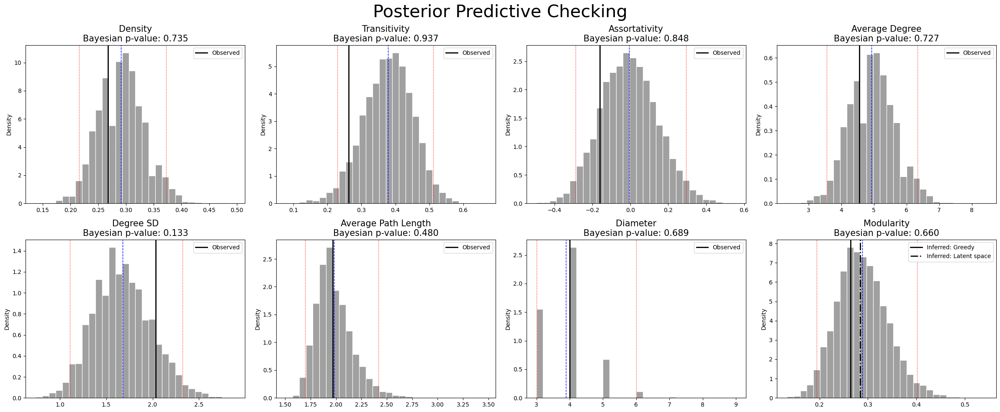

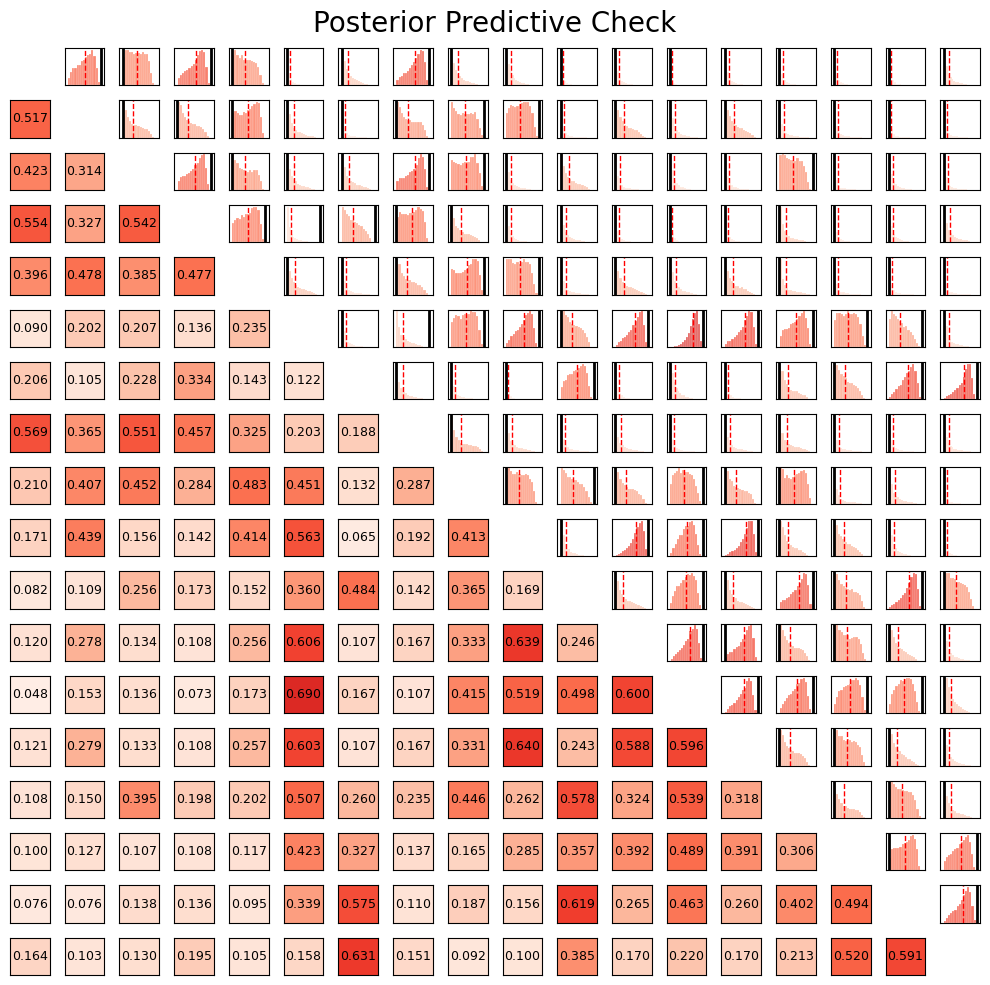

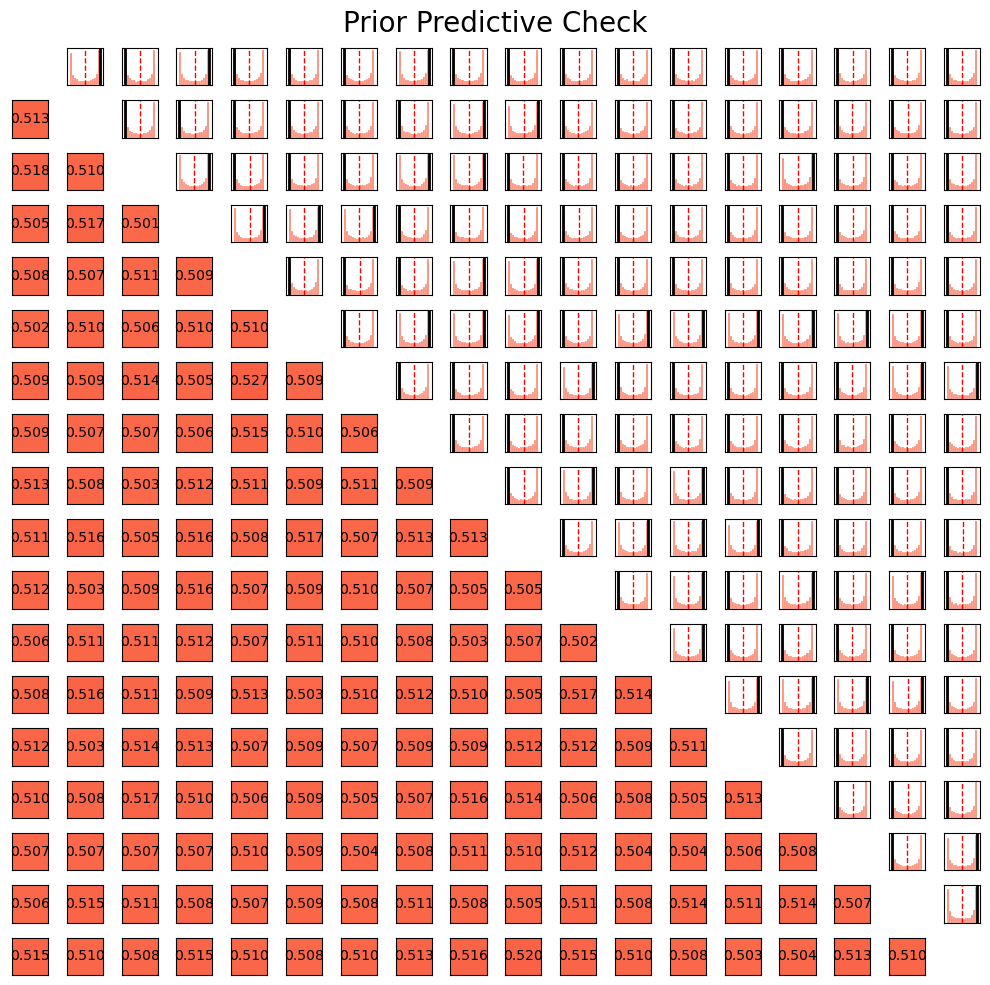

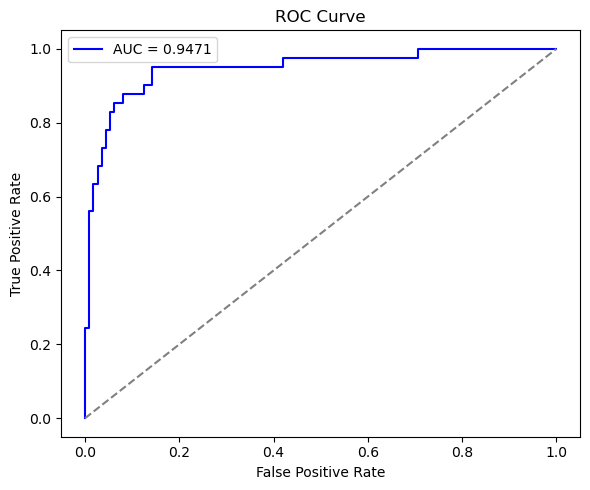

Model: Spherical
Confussion matrix:  {'tp': 22, 'tn': 111, 'fp': 1, 'fn': 19}
AUC: 0.9471
Accuracy: 0.8693
Precision: 0.9565
Recall: 0.5366
F1-score: 0.6875
Specificity: 0.9911


In [6]:
# Configuration
Theta_S2 = {
    'Z0': random_VMF(np.array([0,0,1]), 0, size=n),
    'alpha0': np.float64(0.0),
    'beta0': np.float64(5.0),
    'rho': -0.5,
    'mu_alpha_beta': np.array([0.0, 5.0]),
    'sigma_prior_alpha': 1.0,
    'sigma_prior_beta': 1.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 50000,       
    'thin': 75,            
    'sigma_q_Z': 50.0,       
    'sigma_q_alpha': 0.2,    
    'sigma_q_beta': 0.2      
}


# Estimation
resultsS2 = Estimation_LSMN(Y, Theta_S2, Model="Spherical")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsS2)

#Visualizing latent space
plot_latent_space(resultsS2)

# Posterior predictive checking
posterior_predictive_check(resultsS2)

# Prior predictive checking
prior_predictive_check(resultsS2)

# Prediction evaluation
metricsS2 = prediction_evaluation(resultsS2)

# Save results
#handle_results(resultsS2, filepath='resultsS2.pkl', mode='save')

# Model comparison

In [2]:
resultsR1 = handle_results(filepath='resultsR1.pkl', mode='load')
resultsR2 = handle_results(filepath='resultsR2.pkl', mode='load')
resultsR3 = handle_results(filepath='resultsR3.pkl', mode='load')
resultsS1 = handle_results(filepath='resultsS1.pkl', mode='load')
resultsS2 = handle_results(filepath='resultsS2.pkl', mode='load')

results_dict = {
    'R1': resultsR1,
    'R2': resultsR2,
    'R3': resultsR3,
    'S1': resultsS1,
    'S2': resultsS2
}

Results successfully loaded from: resultsR1.pkl
Results successfully loaded from: resultsR2.pkl
Results successfully loaded from: resultsR3.pkl
Results successfully loaded from: resultsS1.pkl
Results successfully loaded from: resultsS2.pkl


In [3]:
df_comparison = model_comparison(results_dict)
df_comparison

,Model,WAIC,DIC,BIC,mean_log_likelihood,ml_log_likelihood,cm_log_likelihood,map_log_likelihood,min_Rhat,max_Rhat,...,False positive,False negative,p_value_density,p_value_transitivity,p_value_assortativity,p_value_average_degree,p_value_degree_sd,p_value_average_path_length,p_value_diameter,p_value_modularity
0,R1,350.159788,349.291140,423.988401,-75.983990,-89.421972,-84.122542,-86.842687,0.9999,1.0000,...,29,16,0.9729,0.9874,0.8259,0.9703,0.5808,0.0655,0.2987,0.1520
1,R2,388.421326,363.749256,504.734134,-66.492045,-88.227000,-83.585700,-53.453500,0.9999,1.0006,...,14,19,0.5109,0.9608,0.9272,0.4873,0.3038,0.7863,0.9427,0.8539
2,R3,372.569217,340.311835,528.188908,-57.844965,-76.337000,-68.726100,-44.413700,0.9999,1.0005,...,10,18,0.7072,0.9930,0.8324,0.6832,0.6176,0.5609,0.8199,0.6887
3,S1,376.743984,311.685548,481.990294,-77.334922,-73.334100,-68.523000,-68.457100,0.9999,1.0003,...,2,25,0.7474,0.9101,0.8103,0.7381,0.1394,0.4674,0.6752,0.6527
4,S2,381.332471,339.074776,496.647956,-72.229150,-67.034800,-56.678800,-57.017700,0.9999,1.0144,...,1,19,0.7367,0.9291,0.8491,0.7274,0.1346,0.4754,0.6834,0.6500


In [9]:
df_comparison[['Model','WAIC', 'mean_log_likelihood', 'ml_log_likelihood', 'cm_log_likelihood', 'map_log_likelihood']]

,Model,WAIC,mean_log_likelihood,ml_log_likelihood,cm_log_likelihood,map_log_likelihood
0,R1,350.159788,-75.983990,-89.421972,-84.122542,-86.842687
1,R2,388.421326,-66.492045,-88.227000,-83.585700,-53.453500
2,R3,372.569217,-57.844965,-76.337000,-68.726100,-44.413700
3,S1,376.743984,-77.334922,-73.334100,-68.523000,-68.457100
4,S2,381.332471,-72.229150,-67.034800,-56.678800,-57.017700


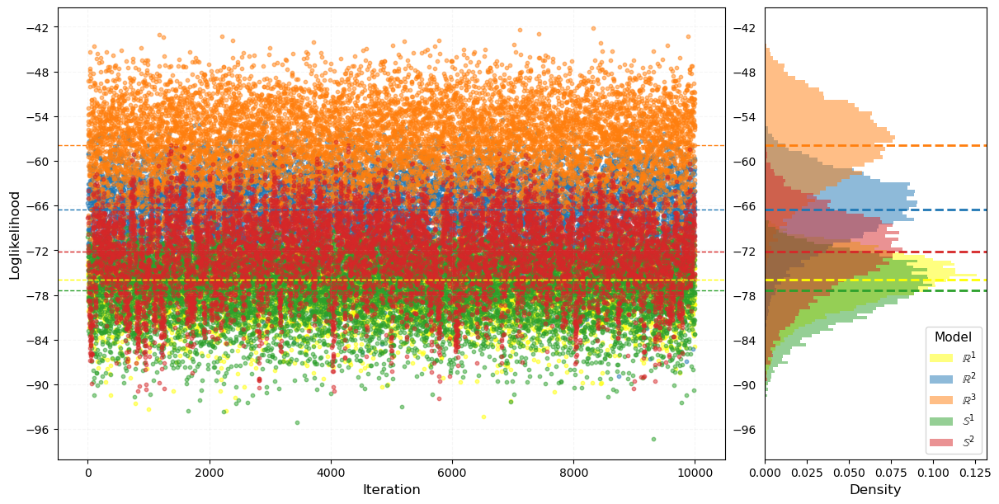

In [4]:
plot_loglikelihood_comparison(results_dict)

Model: Euclidean (R1)
Confusion matrix: tp=25, tn=83, fp=29, fn=16
AUC: 0.7372 | Accuracy: 0.7059 | Precision: 0.4630
Recall: 0.6098 | F1-score: 0.5263 | Specificity: 0.7411
Model: Euclidean (R2)
Confusion matrix: tp=22, tn=98, fp=14, fn=19
AUC: 0.7883 | Accuracy: 0.7843 | Precision: 0.6111
Recall: 0.5366 | F1-score: 0.5714 | Specificity: 0.8750
Model: Euclidean (R3)
Confusion matrix: tp=23, tn=102, fp=10, fn=18
AUC: 0.8380 | Accuracy: 0.8170 | Precision: 0.6970
Recall: 0.5610 | F1-score: 0.6216 | Specificity: 0.9107
Model: Spherical (S1)
Confusion matrix: tp=16, tn=110, fp=2, fn=25
AUC: 0.8926 | Accuracy: 0.8235 | Precision: 0.8889
Recall: 0.3902 | F1-score: 0.5424 | Specificity: 0.9821
Model: Spherical (S2)
Confusion matrix: tp=22, tn=111, fp=1, fn=19
AUC: 0.9473 | Accuracy: 0.8693 | Precision: 0.9565
Recall: 0.5366 | F1-score: 0.6875 | Specificity: 0.9911


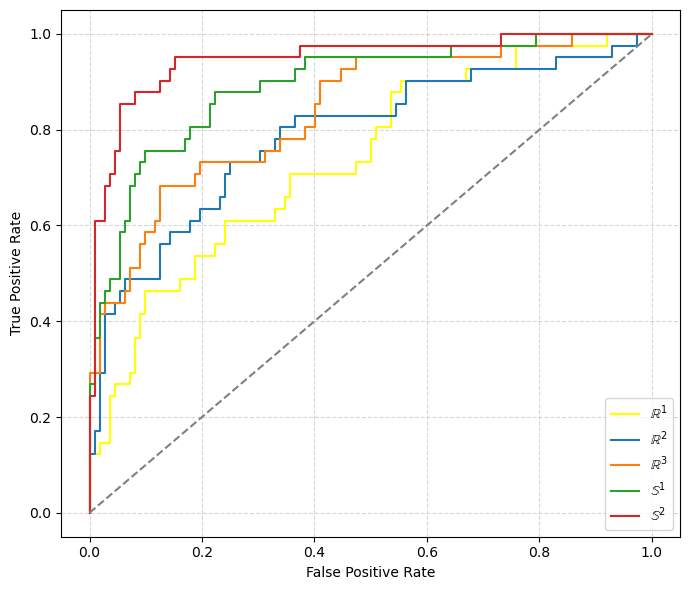

,Model,AUC,Accuracy,Precision,Recall,F1,Specificity,TP,TN,FP,FN
0,R1,0.737152,0.705882,0.462963,0.609756,0.526316,0.741071,25,83,29,16
1,R2,0.788328,0.784314,0.611111,0.536585,0.571429,0.875000,22,98,14,19
2,R3,0.837979,0.816993,0.696970,0.560976,0.621622,0.910714,23,102,10,18
3,S1,0.892639,0.823529,0.888889,0.390244,0.542373,0.982143,16,110,2,25
4,S2,0.947300,0.869281,0.956522,0.536585,0.687500,0.991071,22,111,1,19


In [5]:
df_metrics = compare_prediction_evaluation(results_dict)
df_metrics

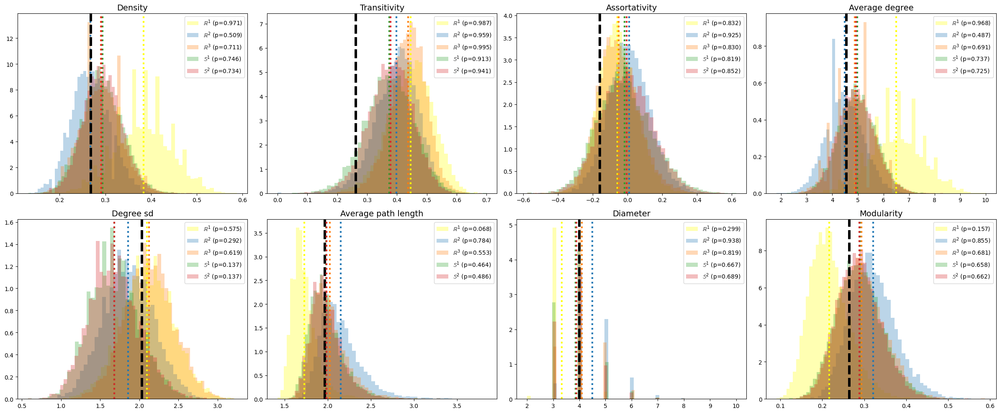

In [6]:
compare_posterior_predictive_checks(results_dict)

In [4]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from sklearn.metrics import f1_score
import numpy as np
from scipy.optimize import linear_sum_assignment

def clustering_f1_score(y_true, y_pred):
    # Crear matriz de confusión
    D = max(y_pred.max(), y_true.max()) + 1
    confusion_matrix = np.zeros((D, D), dtype=np.int64)
    for i in range(len(y_true)):
        confusion_matrix[y_pred[i], y_true[i]] += 1

    row_ind, col_ind = linear_sum_assignment(-confusion_matrix)
    
    y_pred_aligned = np.zeros_like(y_pred)
    for i, j in zip(row_ind, col_ind):
        y_pred_aligned[y_pred == i] = j

    # F1 macro
    return f1_score(y_true, y_pred_aligned, average='macro')

true = np.array([3, 0, 0, 0, 0, 0, 3, 2, 2, 2, 2, 2, 2, 2, 3, 1, 1, 1])
pred = np.array([1, 1, 0, 2, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 3])

print("ARI:", adjusted_rand_score(true, pred))
print("NMI:", normalized_mutual_info_score(true, pred))
print("F1:",clustering_f1_score(true, pred))


ARI: 0.35786672126113217
NMI: 0.4707769652379214
F1: 0.6142156862745098


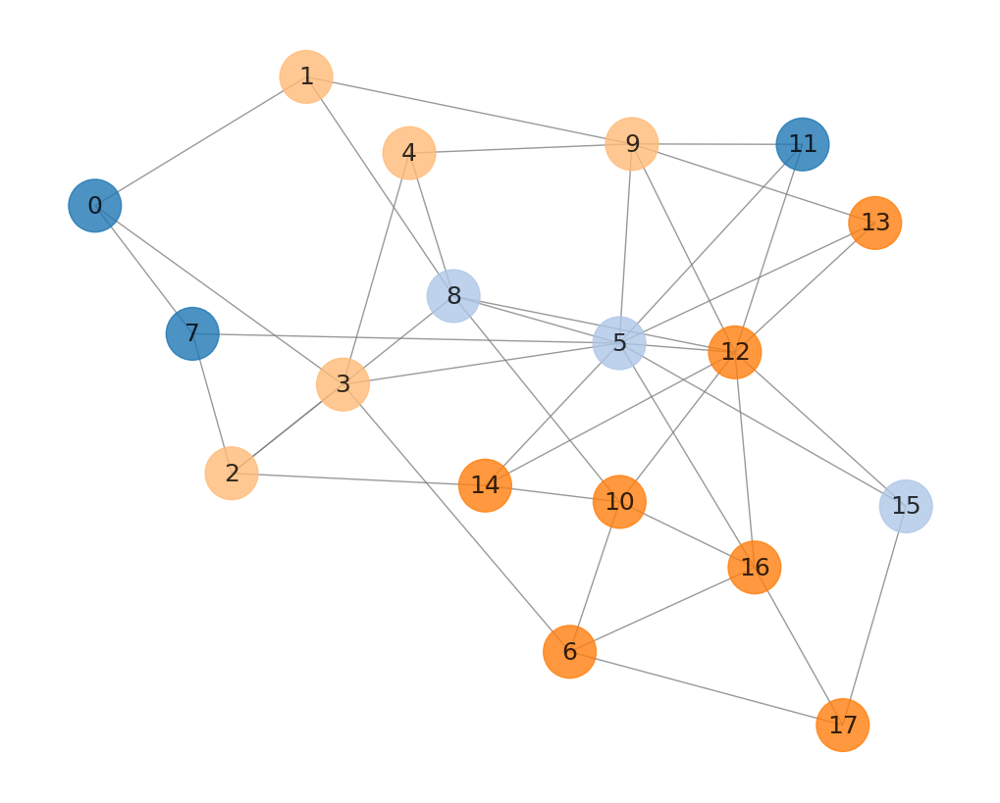

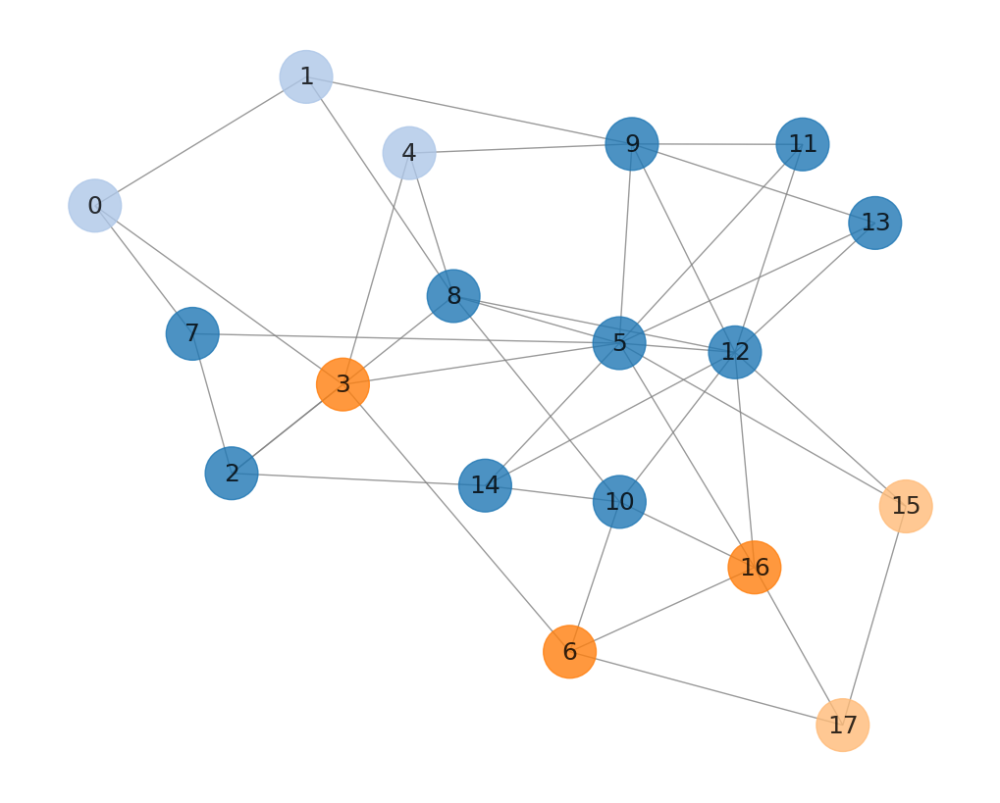

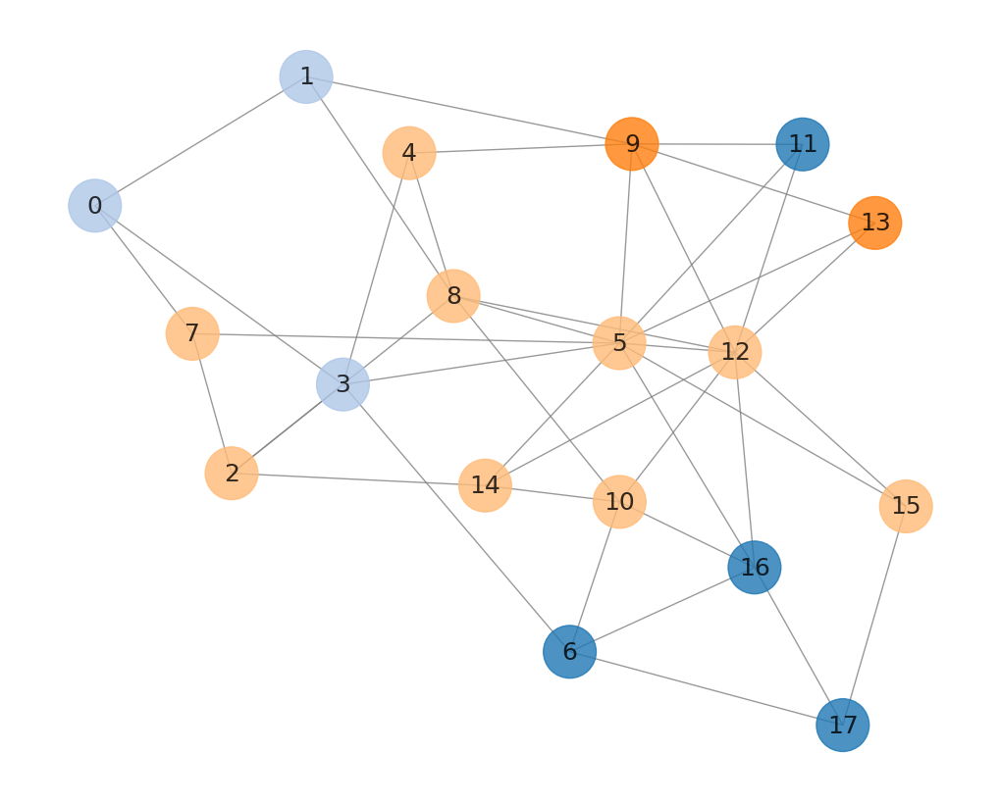

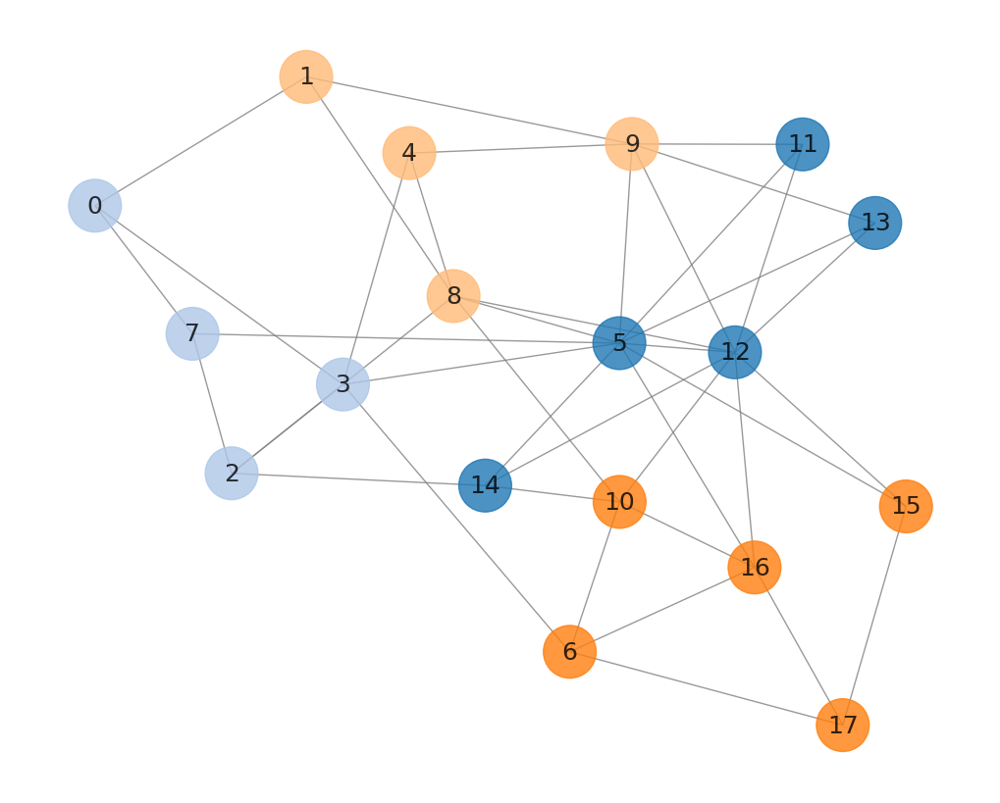

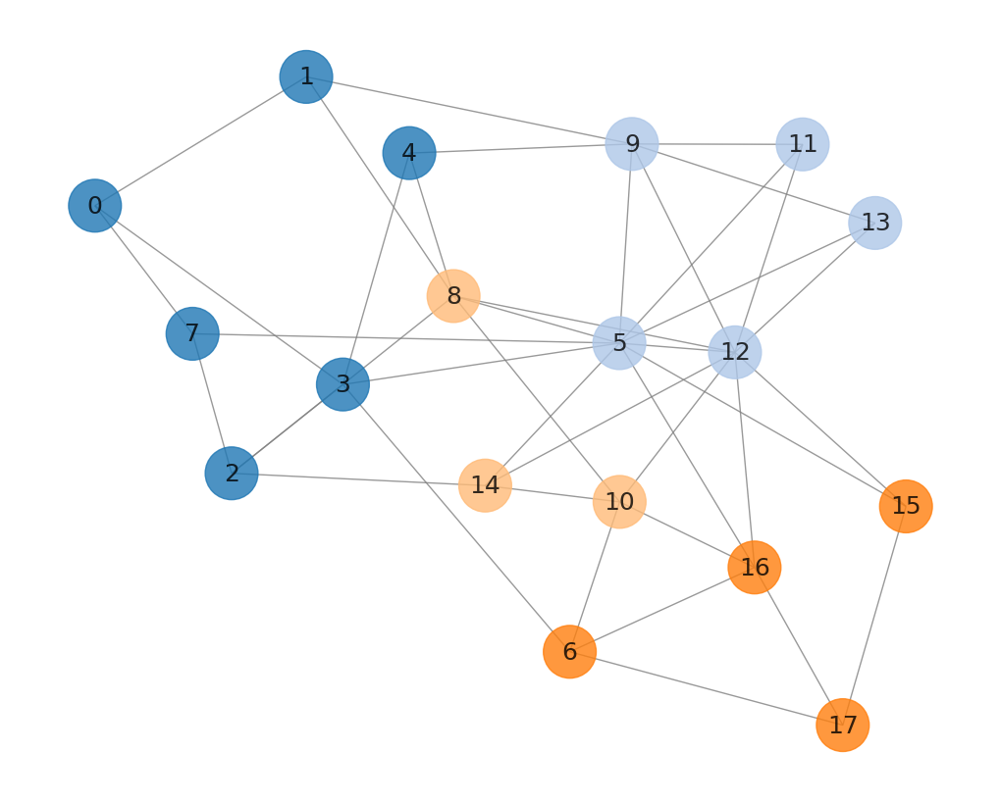

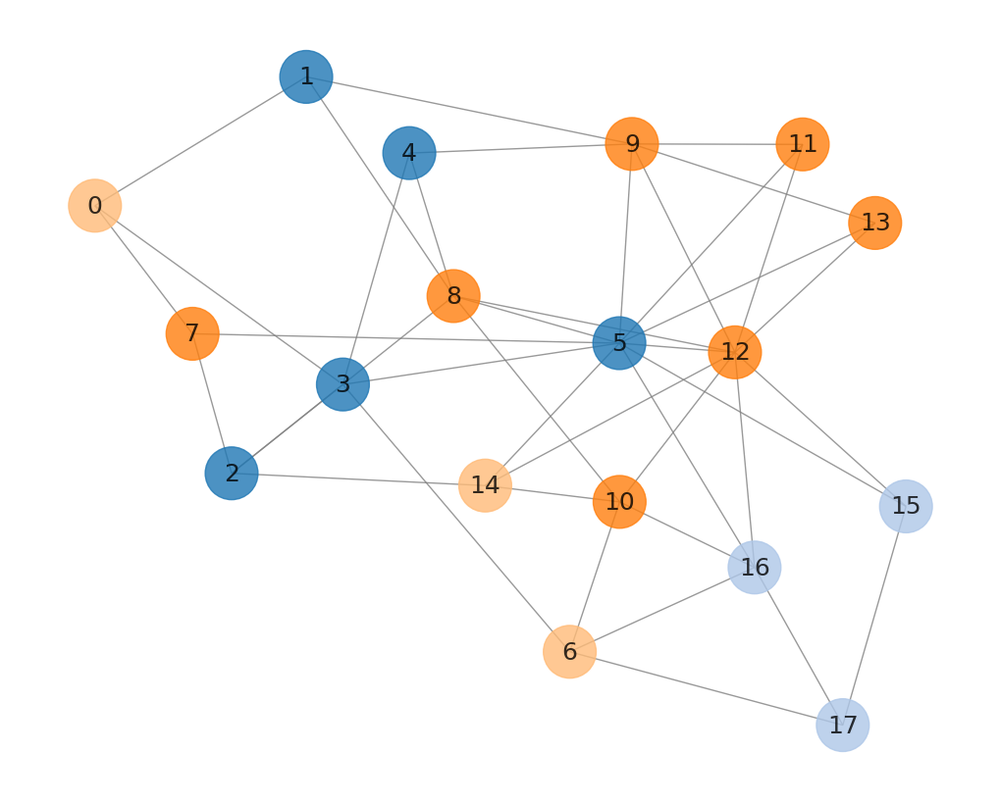

,Model,modularity,ARI,NMI,F1
0,R1,0.121356,0.108807,0.357904,0.425000
1,R2,0.121059,0.357867,0.470777,0.528846
2,R3,0.120167,0.028833,0.295431,0.392857
3,S1,0.245985,0.047136,0.301688,0.458333
4,S2,0.236764,0.285132,0.494251,0.448413
5,Sampson observed,0.005949,1.000000,1.000000,1.000000


In [5]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import SpectralClustering
from networkx.algorithms.community import greedy_modularity_communities
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

def latent_clustering(results_dict, k=[4]):
    
    comms_obs = [[1,2,3,4,5],[15,16,17],[7,8,9,10,11,12,13],[0,6,14]]
    labels_sampson = np.zeros(18, dtype=int)
    for tag, community in enumerate(comms_obs):
        for node in community:
            labels_sampson[node] = tag
    clustering_statistics = []
    for key, results in results_dict.items():
        Y = results['inputs']['Y']
        G = nx.from_numpy_array(Y)
        n = Y.shape[0]
        Model = results['Model']
        partitions = []
        for Z in [results['ml_estimate']['Z'], results['cm_estimate']['Z'],results['map_estimate']['Z']]:
            similarity = np.zeros((n, n))

            for i in range(n):
                for j in range(i+1, n):
                    if Model == "Euclidean":
                        dist = np.linalg.norm(Z[i] - Z[j])
                        sim = np.exp(-1 * dist**2)
                    elif Model == "Spherical":
                        sim = np.exp(np.dot(Z[i], Z[j])-1) 
                    
                    similarity[i, j] = sim
                    similarity[j, i] = sim


            distance_matrix = 1 - similarity + 1e-10
            np.fill_diagonal(distance_matrix, 0)


            clustering = SpectralClustering(
                n_clusters=4,
                affinity='precomputed',
                assign_labels='kmeans',
                random_state=42
            )
            labels = clustering.fit_predict(similarity)
            latent_communities = [[i for i, l in enumerate(labels) if l == tag] for tag in np.unique(labels)]
            score = silhouette_score(distance_matrix, labels, metric='precomputed')
            ari = np.float64(adjusted_rand_score(labels_sampson.astype(int), labels.astype(int)))
            nmi = np.float64(normalized_mutual_info_score(labels_sampson.astype(int), labels.astype(int)))
            f1 = clustering_f1_score(labels_sampson.astype(int), labels.astype(int))
            partitions.append({
                'labels': labels,
                'score': score,
                'latent_communities': latent_communities,
                'modularity': nx.community.modularity(nx.from_numpy_array(Y), latent_communities),
                'ARI': ari,
                'NMI': nmi,
                'F1': f1
            })
        best_partition = max(partitions, key=lambda x: x['ARI'])
        labels = best_partition['labels']
        
        palette = sns.color_palette("tab20", n)
        node_colors = [palette[label] for label in labels]


        pos = nx.spring_layout(G, k=0.1, iterations=50, seed=90)
        plt.figure(figsize=(10, 8))
        nx.draw(
            G,
            pos,
            with_labels=True,
            node_color=node_colors,
            node_size=1500,
            edge_color='gray',
            alpha=0.8, 
            font_size=18
        )
        plt.show()
        clustering_statistics.append({
            'Model': key,
            'modularity': best_partition['modularity'],
            'ARI': best_partition['ARI'],
            'NMI': best_partition['NMI'],
            'F1': f1
        })


    # Sampson observed communities
    real_modularity = nx.community.modularity(G, comms_obs)
    clustering_statistics.append({
            'Model': 'Sampson observed',
            'modularity': real_modularity,
            'ARI': np.float64(adjusted_rand_score(labels_sampson.astype(int), labels_sampson.astype(int))),
            'NMI': np.float64(normalized_mutual_info_score(labels_sampson.astype(int), labels_sampson.astype(int))),
            'F1': clustering_f1_score(labels_sampson.astype(int), labels_sampson.astype(int))
        })
    palette = sns.color_palette("tab20", n)
    node_colors = [palette[label] for label in labels_sampson]


    pos = nx.spring_layout(G, k=0.1, iterations=50, seed=90) 
    plt.figure(figsize=(10, 8))
    nx.draw(
        G,
        pos,
        with_labels=True,
        node_color=node_colors,
        node_size=1500,
        edge_color='gray',
        alpha=0.8, 
        font_size=18
    )
    plt.show()

    return pd.DataFrame(clustering_statistics)

latent_clustering(results_dict)